# 1.Introducion

**MILESTONE 2**

* **NAME** : M.Gifhari Heryndra
* **BATCH**: HCK-015


**OBJECTIVE** :Penelitian ini bertujuan untuk mengembangkan model regresi supervised yang dapat memprediksi kualitas wine berdasarkan atribut kimia dan fisiknya. Dengan menggunakan dataset yang mencakup atribut yang komprehensif dan label kualitas yang akurat, penelitian ini akan melibatkan langkah-langkah preprocessing data, pembuatan beberapa model regresi seperti Regresi Linier, Decision Tree, Random Forest, dan XGBoost, serta evaluasi kinerja model menggunakan metrik yang relevan seperti MSE, MAE, dan R-squared. Tujuan akhirnya adalah menghasilkan model terbaik yang dapat membantu produsen dan penikmat wine dalam memahami serta meningkatkan kualitas produk mereka.

https://huggingface.co/spaces/heryndra/milestone_2

| Feature                          | Description                                                                                   |
| ---------------------------------|-----------------------------------------------------------------------------------------------|
| TYPE                             | Red Wine or White wine                                     |
| VIOLATILE ACIDITY                | The amount of volatile acids in the wine, which can contribute to unpleasant aromas.|
| FIXED ACIDITY                    | The amount of non-volatile acids in the wine|
| CITRID ACID                      | Naturally occurring acid found in fruits, which can add freshness and flavor to the wine|
| RESIDUAL SUGAR                   | The amount of sugar left in the wine after fermentation, which affects sweetness.|
| CHLORIDES                        | The concentration of salt in the wine, which can affect taste.                                                        |
| FREE SULFUR DIOXIDE              | The amount of sulfur dioxide that is not bound to other molecules, which acts as a preservative and antioxidant.               	                                               |
| TOTAL SULFUR DIOXIDE             | The total amount of sulfur dioxide in the wine, including both free and bound forms.       |
| DENSITY                          | The mass of the wine per unit volume.                   |
| PH                               | A measure of acidity or alkalinity of the wine.                |
| SULPHATES                        | The concentration of sulfates in the wine, which can also act as a preservative.      	                                       |
| ALCOHOL                          | The percentage of alcohol in the wine.     	                                   |
| QUALITY                          | The output variable, representing a score between 0 and 10 based on sensory data, indicating the perceived quality of the wine.	                                                       |

# 2.Import Libraries

In [1]:
# library dataframe
import pandas as pd
# library olah data numerical
import numpy as np
# library statistik
from scipy.stats import pearsonr, kendalltau, spearmanr

# Data visualisasi
import matplotlib.pyplot as plt
import seaborn as sns

# libraries Data Preprocessing
from sklearn.model_selection import train_test_split # splittingdata
from feature_engine.outliers import Winsorizer # outlier
from sklearn.preprocessing import StandardScaler, MinMaxScaler,RobustScaler # scalling
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, LabelEncoder # encoder
from imblearn.over_sampling import SMOTE # balancing

from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from xgboost import XGBRegressor


# Library handling outlier
from feature_engine.outliers import Winsorizer

# Pemodelan ML
from sklearn.linear_model import LogisticRegression
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.over_sampling import SMOTE

# Evaluasi model
from sklearn.metrics import ConfusionMatrixDisplay, classification_report, confusion_matrix, precision_score, recall_score, f1_score,accuracy_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.linear_model import LinearRegression

from collections import Counter

# lib pipelines
from sklearn.pipeline import Pipeline

# Save model
import pickle
import joblib
import json

# Library to suppress warnings or deprecation notes
import warnings
warnings.filterwarnings('ignore')

# 3.Data loading

In [2]:
df = pd.read_csv('winequalityN.csv')

In [3]:
df.head(10)

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
5,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
6,white,6.2,0.32,0.16,7.0,0.045,30.0,136.0,0.9949,3.18,0.47,9.6,6
7,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
8,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
9,white,8.1,0.22,0.43,1.5,0.044,28.0,129.0,0.9938,3.22,0.45,11.0,6


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   type                  6497 non-null   object 
 1   fixed acidity         6487 non-null   float64
 2   volatile acidity      6489 non-null   float64
 3   citric acid           6494 non-null   float64
 4   residual sugar        6495 non-null   float64
 5   chlorides             6495 non-null   float64
 6   free sulfur dioxide   6497 non-null   float64
 7   total sulfur dioxide  6497 non-null   float64
 8   density               6497 non-null   float64
 9   pH                    6488 non-null   float64
 10  sulphates             6493 non-null   float64
 11  alcohol               6497 non-null   float64
 12  quality               6497 non-null   int64  
dtypes: float64(11), int64(1), object(1)
memory usage: 660.0+ KB


* Terdapat 13 kolom di dataset ini, hampir semua data berisikan tipe data yg numerikal dan berisikan 6497 row tertapi terlihat ada beberapa kolom yang memiliki `null` value

In [5]:
df.isna().sum().sort_values(ascending=False)

fixed acidity           10
pH                       9
volatile acidity         8
sulphates                4
citric acid              3
residual sugar           2
chlorides                2
type                     0
free sulfur dioxide      0
total sulfur dioxide     0
density                  0
alcohol                  0
quality                  0
dtype: int64

* Terlihat bahwa 38 informasi yg `null`, mungkin akan di drop di bagian feature engineering untuk mempermudah modeling dan di karenakan jumlah `null` value di bawah 5% yg artinya tidak memiliki kerugian untuk di drop.

In [6]:
df.duplicated().sum()

1168

* Terdapat 1168 informasi yg memiliki kesamaan atau terjadi duplikasi dan harus di drop untuk memaksimalkan hasil prediksi.

In [7]:
df = df.drop_duplicates()


In [8]:
df.duplicated().sum()

0

In [9]:
df['quality'].value_counts()

quality
6    2327
5    1755
7     857
4     206
8     149
3      30
9       5
Name: count, dtype: int64

In [10]:
df.columns = df.columns.str.replace(' ', '_')

* untuk memudahkan pengerjaan modeling saya menambhkan underscore untuk tidak adanya missing gap antara suku kata.

# 4.Exploratory Data Analysis

In [11]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
fixed_acidity,5319.0,7.216573,1.319194,3.80000,6.4000,7.00000,7.70000,15.90000
volatile_acidity,5321.0,0.344123,0.168228,0.08000,0.2300,0.30000,0.41000,1.58000
citric_acid,5326.0,0.318738,0.147116,0.00000,0.2400,0.31000,0.40000,1.66000
residual_sugar,5327.0,5.053839,4.504005,0.60000,1.8000,2.70000,7.50000,65.80000
chlorides,5327.0,0.056668,0.036845,0.00900,0.0380,0.04700,0.06600,0.61100
free_sulfur_dioxide,5329.0,30.060143,17.815588,1.00000,16.0000,28.00000,41.00000,289.00000
total_sulfur_dioxide,5329.0,114.189341,56.781422,6.00000,75.0000,116.00000,154.00000,440.00000
density,5329.0,0.994536,0.002966,0.98711,0.9922,0.99464,0.99677,1.03898
pH,5320.0,3.224434,0.160275,2.72000,3.1100,3.21000,3.33000,4.01000
sulphates,5325.0,0.533268,0.149724,0.22000,0.4300,0.51000,0.60000,2.00000


Berdasarkan hasil statistik awal diatas terdapat beberapa temuan seperti:

1. **Fixed Acidity (Kekasaman Tetap)**:
   - Rata-rata kekuatan keasaman yang tetap pada anggur adalah sekitar 7.22, dengan variasi yang signifikan antara 3.8 hingga 15.9. Ini dapat mempengaruhi rasa dan struktur anggur.

2. **Volatile Acidity (Kekasaman Mudah Menguap)**:
   - Ini mengukur tingkat asam yang mudah menguap dalam anggur. Rata-ratanya sekitar 0.34, dengan variasi antara 0.08 hingga 1.58. Kadar asam yang lebih tinggi dapat memberikan rasa anggur yang kurang menyenangkan.

3. **Citric Acid (Asam Sitrat)**:
   - Rata-rata kandungan asam sitrat adalah sekitar 0.32. Asam sitrat memberikan rasa segar dan dapat membantu menjaga keseimbangan rasa dalam anggur.

4. **Residual Sugar (Gula Sisa)**:
   - Rata-rata gula sisa setelah fermentasi adalah sekitar 5.05 gram per liter, tetapi ada variasi yang besar, dari 0.6 hingga 65.8 gram per liter. Kandungan gula sisa dapat mempengaruhi tingkat manis dan tubuh anggur.

5. **Chlorides (Klorida)**:
   - Rata-rata konsentrasi klorida adalah sekitar 0.056 gram per liter. Kadar klorida yang tinggi dapat memberikan rasa asin pada anggur.

6. **Free Sulfur Dioxide (Sulfur Dioksida Bebas)**:
   - Rata-rata kandungan sulfur dioksida bebas adalah sekitar 30.06 miligram per liter. Sulfur dioksida digunakan sebagai pengawet dan antioksidan dalam anggur.

7. **Total Sulfur Dioxide (Total Sulfur Dioksida)**:
   - Rata-rata kandungan total sulfur dioksida adalah sekitar 114.19 miligram per liter. Kadar sulfur dioksida yang tinggi dapat melindungi anggur dari oksidasi dan kontaminasi mikroba.

8. **Density (Kerapatan)**:
   - Rata-rata kerapatan anggur adalah sekitar 0.9945. Kerapatan mempengaruhi tekstur dan kekentalan anggur.

9. **pH**:
   - Rata-rata tingkat pH adalah sekitar 3.22. pH yang rendah menunjukkan tingkat keasaman yang tinggi, sementara pH yang tinggi menunjukkan keasaman yang rendah.

10. **Sulphates (Sulfat)**:
    - Rata-rata kandungan sulfat adalah sekitar 0.53 gram per liter. Sulfat dapat mempengaruhi stabilitas dan potensi antioksidan anggur.

11. **Alcohol (Alkohol)**:
    - Rata-rata kadar alkohol dalam anggur adalah sekitar 10.55%. Kadar alkohol yang lebih tinggi dapat memberikan sensasi hangat dan mempengaruhi struktur anggur.

12. **Quality (Kualitas)**:
    - Rata-rata skor kualitas anggur adalah sekitar 5.80. Skor kualitas biasanya berkisar dari 3 hingga 9, dengan skor yang lebih tinggi menunjukkan kualitas yang lebih baik. Skor kualitas dipengaruhi oleh berbagai faktor lainnya dalam dataset.

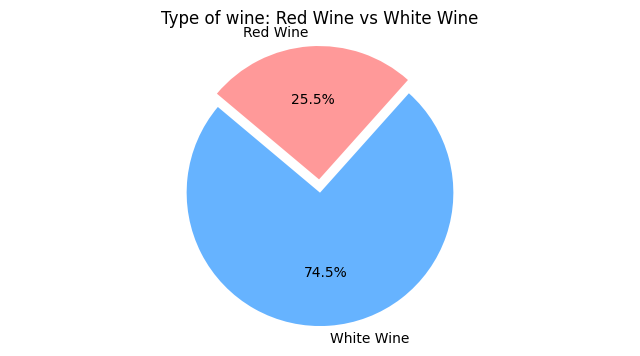

In [12]:
# Data untuk pie chart
labels = ['White Wine', 'Red Wine']
sizes = [3970, 1359]  # Jumlah anggur putih dan merah
colors = ['#66b3ff', '#ff9999']  # Warna untuk masing-masing bagian (putih, merah)
explode = (0, 0.1)  # Menonjolkan potongan kedua (red wine)

# Membuat pie chart
plt.figure(figsize=(8, 4))
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)

# Atur aspek lingkaran agar menjadi lingkaran
plt.axis('equal')

# Tambahkan judul
plt.title('Type of wine: Red Wine vs White Wine')

# Tampilkan pie chart
plt.show()


* Terlihat dari dataset yang saya punya,anggur merah adalah jenis anggur yang lebih populer, yaitu sebesar 74.5% dari pasar. Sedangkan anggur putih kurang populer, yaitu sebesar 25.5% dari pasar.

<Axes: xlabel='quality', ylabel='count'>

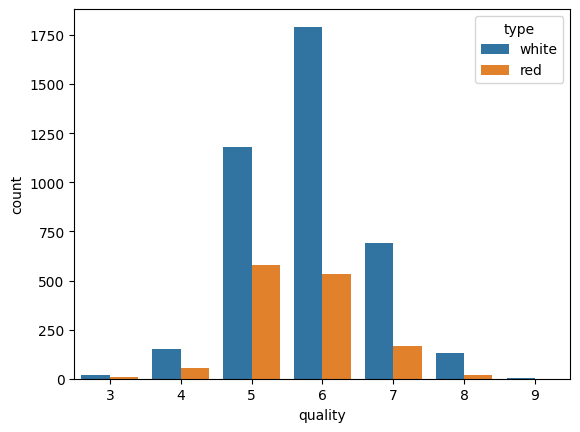

In [13]:
sns.countplot(df, x="quality", hue="type")

* tipe terdiri dari 2 yaitu white wine dan red wine, terlihat dari data set ini wine yg memiliki kualitas 6 memiliki proporsi yg lebih banyak di bandingkan yang lainnya, dan white wine memiliki jumlah yg terbanyak dengan memiliki quality kisaran 6.

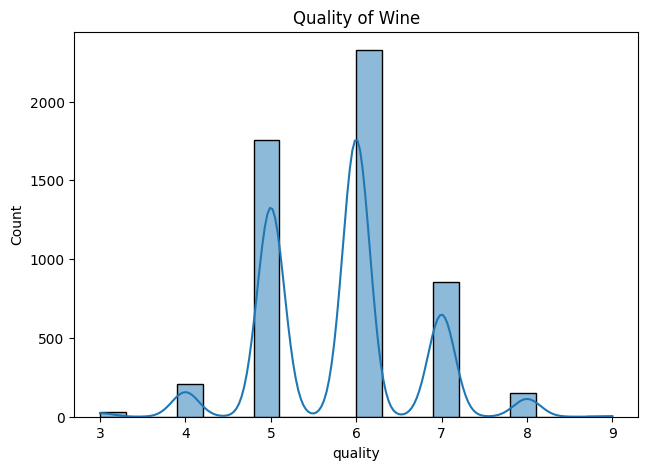

In [14]:
# membuat histogram
def plot_histogram(df_column, title):
    plt.figure(figsize=(16, 5))
    plt.subplot(1, 2, 1)
    sns.histplot(df_column, kde=True, bins=20)
    plt.title(title)
    plt.show()

plot_histogram (df['quality'],'Quality of Wine')


Berdasarkan hasil visualisai awal terlihat bahawa kualitas wine berada di angka 3 sampai 9.

Berikut adalah beberapa pengamatan yang dapat saya buat dari histogram:

* Ada lebih banyak anggur yang dinilai memiliki kualitas lebih tinggi (di sebelah kanan sumbu) dibandingkan anggur yang dinilai memiliki kualitas lebih rendah.
Peringkat kualitas yang paling sering ditemukan berada antara angka 5 dan 6.

In [102]:
import plotly.graph_objects as go
import plotly.express as px

def visualize_data_with_target_histogram(df, columns, target_col):
    # Create subplots based on the number of columns
    fig = go.Figure()

    # Loop through each column and create the visualization
    for col in columns:
        if df[col].dtype == 'object':
            # For categorical variables, create a bar plot with target_col as hue
            fig.add_trace(go.Bar(x=df[col], y=df[target_col], name=target_col, marker_color='royalblue'))
            fig.update_layout(barmode='group', xaxis_title=col, yaxis_title='Count', title=f'{col} Distribution')
        else:
            # For numerical variables, create histograms for each category of the target variable
            fig = px.histogram(df, x=col, color=target_col, marginal='violin', title=f'{col} Distribution')
    
    fig.show()


In [104]:
import plotly.express as px

def visualize_data_with_target_histogram(df, columns, target_col):
    # Create subplots based on the number of columns
    for col in columns:
        if df[col].dtype == 'object':
            # For categorical variables, create a bar plot with target_col as hue
            fig = px.histogram(df, x=col, color=target_col, barmode='group', title=f'{col} Distribution')
            fig.show()
        else:
            # For numerical variables, create histograms for each category of the target variable
            fig = px.histogram(df, x=col, color=target_col, marginal='violin', title=f'{col} Distribution')
            fig.show()

# Memanggil fungsi untuk membuat visualisasi
visualize_data_with_target_histogram(df, ['type', 'fixed_acidity', 'volatile_acidity', 'citric_acid',
       'residual_sugar', 'chlorides', 'free_sulfur_dioxide',
       'total_sulfur_dioxide', 'density', 'pH', 'sulphates', 'alcohol',
       'quality'], 'quality')


In [107]:
import plotly.express as px

def visualize_data_with_target_histogram(df, columns, target_col):
    # Loop through each column and create the visualization
    for col in columns:
        if df[col].dtype == 'object':
            # For categorical variables, create a bar plot with target_col as hue
            fig = px.histogram(df, x=col, color=target_col, barmode='group', title=f'{col} Distribution')
            fig.update_layout(bargap=0.3, bargroupgap=0.2)  # Adjust bargap and bargroupgap for larger bars
            fig.show()
        else:
            # For numerical variables, create histograms for each category of the target variable
            fig = px.histogram(df, x=col, color=target_col, barmode='group', title=f'{col} Distribution')
            fig.update_layout(bargap=0.3, bargroupgap=0.2)  # Adjust bargap and bargroupgap for larger bars
            fig.show()

# Memanggil fungsi untuk membuat visualisasi
visualize_data_with_target_histogram(df, ['type', 'fixed_acidity', 'volatile_acidity', 'citric_acid',
       'residual_sugar', 'chlorides', 'free_sulfur_dioxide',
       'total_sulfur_dioxide', 'density', 'pH', 'sulphates', 'alcohol',
       'quality'], 'quality')


In [109]:
import plotly.express as px

def visualize_data_with_target_histogram(df, columns, target_col):
    # Loop through each column and create the visualization
    for col in columns:
        if df[col].dtype == 'object':
            # For categorical variables, create a bar plot with target_col as hue
            fig = px.histogram(df, x=col, color=target_col, barmode='group', title=f'{col} Distribution')
            fig.update_layout(bargap=0.4, bargroupgap=0.3, width=1000, height=600)  # Adjust bargap, bargroupgap, width, and height for larger bars and plot size
            fig.show()
        else:
            # For numerical variables, create histograms for each category of the target variable
            fig = px.histogram(df, x=col, color=target_col, barmode='group', title=f'{col} Distribution')
            fig.update_layout(bargap=0.4, bargroupgap=0.3, width=1000, height=600)  # Adjust bargap, bargroupgap, width, and height for larger bars and plot size
            fig.show()

# Memanggil fungsi untuk membuat visualisasi
visualize_data_with_target_histogram(df, ['type', 'fixed_acidity', 'volatile_acidity', 'citric_acid',
       'residual_sugar', 'chlorides', 'free_sulfur_dioxide',
       'total_sulfur_dioxide', 'density', 'pH', 'sulphates', 'alcohol',
       'quality'], 'quality')


In [108]:
import plotly.express as px

def visualize_data_with_target_histogram(df, columns, target_col):
    # Loop through each column and create the visualization
    for col in columns:
        if df[col].dtype == 'object':
            # For categorical variables, create a bar plot with target_col as hue
            fig = px.histogram(df, x=col, color=target_col, barmode='group', title=f'{col} Distribution')
            fig.update_layout(bargap=0.3, bargroupgap=0.2)  # Adjust bargap and bargroupgap for larger bars
            fig.show()
        else:
            # For numerical variables, create histograms for each category of the target variable
            fig = px.histogram(df, x=col, color=target_col, barmode='group', title=f'{col} Distribution')
            fig.update_layout(bargap=0.3, bargroupgap=0.2)  # Adjust bargap and bargroupgap for larger bars
            fig.show()

# Memanggil fungsi untuk membuat visualisasi
visualize_data_with_target_histogram(df, ['type', 'fixed_acidity', 'volatile_acidity', 'citric_acid',
       'residual_sugar', 'chlorides', 'free_sulfur_dioxide',
       'total_sulfur_dioxide', 'density', 'pH', 'sulphates', 'alcohol',
       'quality'], 'quality')


In [106]:
import plotly.express as px

def visualize_data_with_target_histogram(df, columns, target_col):
    # Loop through each column and create the visualization
    for col in columns:
        if df[col].dtype == 'object':
            # For categorical variables, create a bar plot with target_col as hue
            fig = px.histogram(df, x=col, color=target_col, barmode='group', title=f'{col} Distribution')
            fig.update_layout(bargap=0.2)  # Adjust bargap for larger bars
            fig.show()
        else:
            # For numerical variables, create histograms for each category of the target variable
            fig = px.histogram(df, x=col, color=target_col, barmode='group', title=f'{col} Distribution')
            fig.update_layout(bargap=0.2)  # Adjust bargap for larger bars
            fig.show()

# Memanggil fungsi untuk membuat visualisasi
visualize_data_with_target_histogram(df, ['type', 'fixed_acidity', 'volatile_acidity', 'citric_acid',
       'residual_sugar', 'chlorides', 'free_sulfur_dioxide',
       'total_sulfur_dioxide', 'density', 'pH', 'sulphates', 'alcohol',
       'quality'], 'quality')


In [105]:
import plotly.express as px

def visualize_data_with_target_histogram(df, columns, target_col):
    # Loop through each column and create the visualization
    for col in columns:
        if df[col].dtype == 'object':
            # For categorical variables, create a bar plot with target_col as hue
            fig = px.histogram(df, x=col, color=target_col, barmode='group', title=f'{col} Distribution')
            fig.show()
        else:
            # For numerical variables, create histograms for each category of the target variable
            fig = px.histogram(df, x=col, color=target_col, barmode='group', title=f'{col} Distribution')
            fig.show()

# Memanggil fungsi untuk membuat visualisasi
visualize_data_with_target_histogram(df, ['type', 'fixed_acidity', 'volatile_acidity', 'citric_acid',
       'residual_sugar', 'chlorides', 'free_sulfur_dioxide',
       'total_sulfur_dioxide', 'density', 'pH', 'sulphates', 'alcohol',
       'quality'], 'quality')


In [16]:
df.columns

Index(['type', 'fixed_acidity', 'volatile_acidity', 'citric_acid',
       'residual_sugar', 'chlorides', 'free_sulfur_dioxide',
       'total_sulfur_dioxide', 'density', 'pH', 'sulphates', 'alcohol',
       'quality'],
      dtype='object')

In [101]:
import plotly as pl

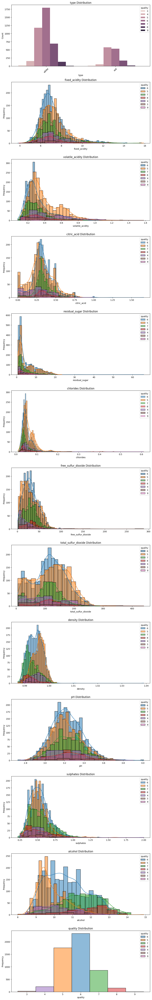

In [17]:
visualize_data_with_target_histogram(df, ['type', 'fixed_acidity', 'volatile_acidity', 'citric_acid',
       'residual_sugar', 'chlorides', 'free_sulfur_dioxide',
       'total_sulfur_dioxide', 'density', 'pH', 'sulphates', 'alcohol',
       'quality',]
                                            , 'quality')

**Penjelasan Distribusi Kualitas Wine Berdasarkan Gambar**

Berdasarkan gambar yang Anda kirimkan, terlihat bahwa distribusi kualitas wine menunjukkan tren yang positif. 

**Analisis Histogram**

Histogram tersebut menunjukkan distribusi kualitas wine dengan skor berkisar antara 3 hingga 9. Sumbu x menunjukkan skor kualitas, sedangkan sumbu y menunjukkan jumlah wine dengan skor tersebut. 

**Kesimpulan**

Berdasarkan histogram, dapat disimpulkan bahwa:

* **Mayoritas wine memiliki skor kualitas yang baik.** Sebagian besar wine berada di rentang skor 5 hingga 9, menunjukkan bahwa kualitas wine umumnya baik.
* **Jumlah wine dengan skor kualitas tinggi lebih banyak.** Terdapat lebih banyak wine dengan skor 8 dan 9 dibandingkan dengan skor 3 dan 4. Hal ini menunjukkan bahwa wine dengan kualitas tinggi lebih banyak tersedia.
* **Distribusi kualitas wine terpusat pada skor 6.** Skor 6 merupakan skor terbanyak, menunjukkan bahwa wine dengan kualitas rata-rata cukup banyak.

**Kesimpulan Umum**

Secara keseluruhan, distribusi kualitas wine menunjukkan bahwa wine dengan kualitas baik dan tinggi lebih banyak tersedia dibandingkan wine dengan kualitas rendah. Hal ini menunjukkan bahwa konsumen memiliki pilihan yang lebih luas untuk memilih wine yang sesuai dengan selera. Tetapi dari hasil fitur diatas kadar `alcohol` sangat terlihat bahwa adanya keterlibatan antara quality terlihat dari penyeberan data yg terlihat konsisten. Seperti `pH` memiliki fitur yg memiliki korelasi terhadap kualitas tetapi perlu diingat ini adalah analisa awal untuk memudahkan saya melihat secara umum fitur umum yg memiliki korelasi terhadap `quality`






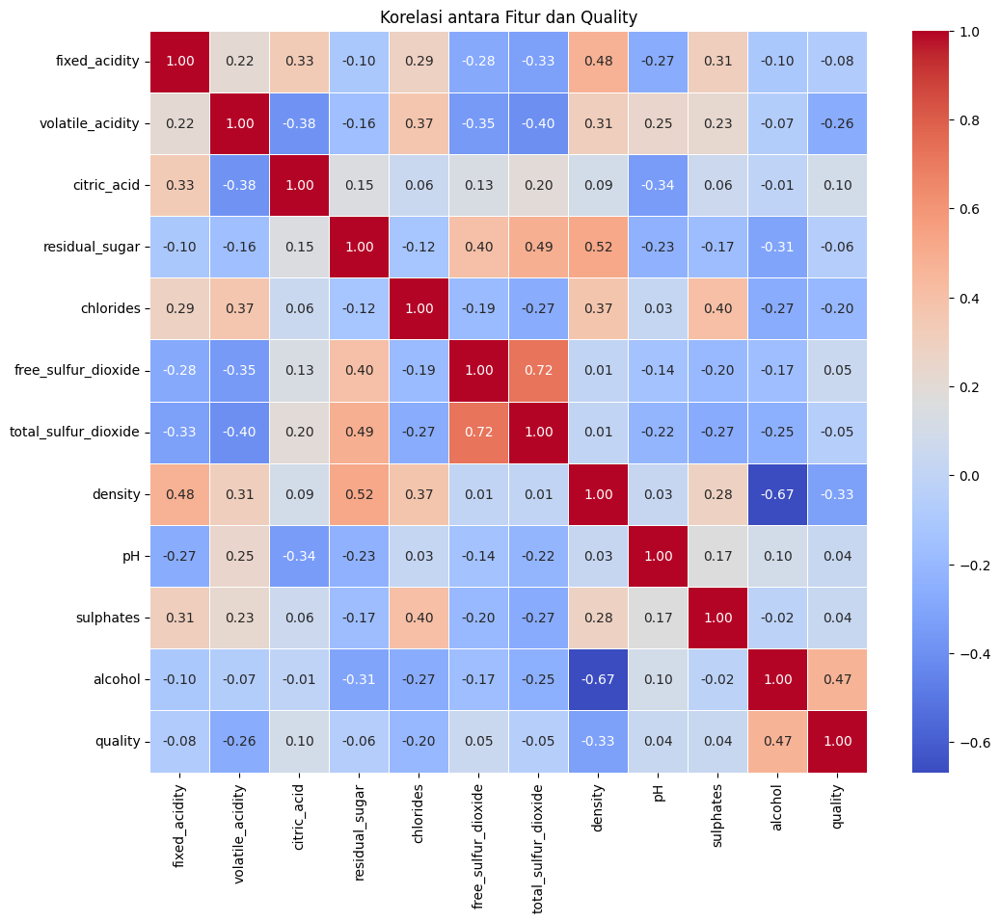

In [18]:
corr = df.loc[:, df.columns != 'type'].corr()

# Buat heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Korelasi antara Fitur dan Quality')
plt.show()


Variabel "kualitas" dalam dataset mewakili kualitas keseluruhan dari wine. Melalui matriks korelasi, kita dapat melihat seberapa kuat hubungan antara variabel tersebut dengan variabel lainnya. Beberapa temuan dari matriks korelasi ini adalah sebagai berikut:

1. **Alkohol:** Kandungan alkohol memiliki korelasi negatif dengan kualitas wine. Artinya, wine dengan kandungan alkohol yang lebih tinggi cenderung memiliki kualitas yang lebih rendah.

2. **pH:** Nilai pH memiliki korelasi positif dengan kualitas wine. Ini menandakan bahwa wine dengan nilai pH yang lebih tinggi cenderung memiliki kualitas yang lebih tinggi.

3. **Asam Tetap (Fixed Acidity):** Korelasi antara asam tetap dan kualitas wine cenderung lemah dan positif. Ini menunjukkan bahwa tidak ada hubungan linear yang kuat antara tingkat keasaman tetap dan kualitas wine.

Dengan hasil visualisai awal kita bisa melihat fitur mana saja yg dapat berpengaruh terhadap kualitas, tetapi ini bukan hasil yg menjadi absolute untuk menentukan fitur mana saja yg memiliki signifikasinsi terhap quality maka akan di lanjutkan uji statistik di bagian feature engineering.

# 5.Feature Engineering

### 5.1 Checking Cardinality

In [19]:
# Filter only categorical columns into variable
kolom_kat = ['type']

# Making empty list for appending the unique values
kat_unique_data = []

# For loop in every categorical column and count the unique values, append the calculation into empty list
for kolom in kolom_kat:
    kat_unique_data.append([kolom, df[kolom].nunique()])

# Showing dataframe consisting 
pd.DataFrame(data=kat_unique_data, columns=['kolom_kategorikal', 'unique_value'])


,kolom_kategorikal,unique_value
0,type,2


* Terlihat dari pengecekan diatas untuk data yg memiliki kategorikal memiliki low cardinality karena hanya memiliki 2 `type` yaitu white wine adn red wine

### 5.2 Split test

In [20]:
# Definisikan data fitur dan prediksi
X = df.drop('quality', axis=1)
y = df['quality']

* Disini saya melakukan split test untuk memisahkan kolom fitur dan target yaitu `quality`

In [21]:
X.T

,0,1,2,3,6,9,10,11,12,13,...,6486,6487,6488,6489,6490,6491,6492,6493,6495,6496
type,white,white,white,white,white,white,white,white,white,white,...,red,red,red,red,red,red,red,red,red,red
fixed_acidity,7.0,6.3,8.1,7.2,6.2,8.1,8.1,8.6,7.9,6.6,...,7.2,6.6,6.3,5.4,6.3,6.8,6.2,5.9,5.9,6.0
volatile_acidity,0.27,0.3,0.28,0.23,0.32,0.22,0.27,0.23,0.18,0.16,...,NaN,0.725,0.55,0.74,0.51,0.62,0.6,0.55,0.645,0.31
citric_acid,0.36,0.34,0.4,0.32,0.16,0.43,0.41,0.4,0.37,0.4,...,0.33,0.2,0.15,0.09,0.13,0.08,0.08,0.1,0.12,0.47
residual_sugar,20.7,1.6,6.9,8.5,7.0,1.5,1.45,4.2,1.2,1.5,...,2.5,7.8,1.8,1.7,2.3,1.9,2.0,2.2,2.0,3.6
chlorides,0.045,0.049,0.05,0.058,0.045,0.044,0.033,0.035,0.04,0.044,...,0.068,0.073,0.077,0.089,0.076,0.068,0.09,0.062,0.075,0.067
free_sulfur_dioxide,45.0,14.0,30.0,47.0,30.0,28.0,11.0,17.0,16.0,48.0,...,34.0,29.0,26.0,16.0,29.0,28.0,32.0,39.0,32.0,18.0
total_sulfur_dioxide,170.0,132.0,97.0,186.0,136.0,129.0,63.0,109.0,75.0,143.0,...,102.0,79.0,35.0,26.0,40.0,38.0,44.0,51.0,44.0,42.0
density,1.001,0.994,0.9951,0.9956,0.9949,0.9938,0.9908,0.9947,0.992,0.9912,...,0.99414,0.9977,0.99314,0.99402,0.99574,0.99651,0.9949,0.99512,0.99547,0.99549
pH,3.0,3.3,3.26,3.19,3.18,3.22,2.99,3.14,3.18,3.54,...,3.27,3.29,3.32,3.67,3.42,3.42,3.45,3.52,3.57,3.39


In [22]:
y.shape

(5329,)

In [23]:
X.shape

(5329, 12)

* Jumlah row berada di angka 5329 dan 12 fitur dan 1 target.

### 5.3 Checking Missing Values

<Axes: >

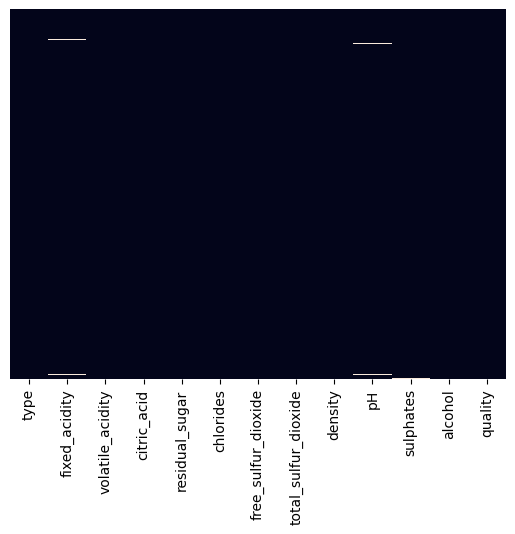

In [24]:
# membuat heatmap
sns.heatmap(df.isna(),yticklabels=False ,cbar=False)

In [25]:
X.sample(20).T

,6037,240,5258,4836,1442,5989,2661,1138,1817,5117,4133,2717,637,5925,3591,3882,2985,4807,852,3427
type,red,white,red,white,white,red,white,white,white,red,white,white,white,red,white,white,white,white,white,white
fixed_acidity,8.2,7.3,8.2,6.7,8.0,7.9,7.2,9.2,7.2,7.8,5.7,6.8,7.4,6.4,6.4,7.1,6.7,6.0,6.9,5.8
volatile_acidity,0.51,0.32,0.7,0.5,0.25,0.34,0.3,0.28,0.5,0.53,0.25,0.16,0.28,0.795,0.28,0.2,0.18,0.17,0.18,0.24
citric_acid,0.24,0.23,0.23,0.36,0.49,0.42,0.26,0.46,0.0,0.33,0.27,0.29,0.25,0.0,0.36,0.37,0.28,0.3,0.36,0.26
residual_sugar,2.0,13.7,2.0,11.5,1.2,2.0,1.5,3.2,0.8,2.4,11.5,10.4,11.9,2.2,1.3,1.5,10.2,7.3,1.3,10.05
chlorides,0.079,0.05,0.099,0.096,0.061,0.086,0.041,0.058,0.034,0.08,0.04,0.046,0.053,0.065,0.053,0.049,0.039,0.039,0.036,0.039
free_sulfur_dioxide,16.0,49.0,14.0,18.0,27.0,8.0,46.0,39.0,46.0,24.0,24.0,59.0,25.0,28.0,28.0,28.0,29.0,39.0,40.0,63.0
total_sulfur_dioxide,86.0,197.0,81.0,92.0,117.0,19.0,178.0,133.0,114.0,144.0,120.0,143.0,148.0,52.0,186.0,129.0,115.0,104.0,117.0,162.0
density,0.99764,0.9985,0.9973,0.99642,0.9938,0.99546,0.99154,0.996,0.9932,0.99655,0.99411,0.99518,0.9976,0.99378,0.99211,0.99226,0.99469,0.99252,0.9934,0.99375
pH,3.34,3.2,3.19,3.11,3.08,3.35,3.19,3.14,3.19,3.3,3.33,3.2,3.1,3.49,3.31,3.15,3.11,2.91,3.27,3.33


In [26]:
X.isnull().sum()

type                     0
fixed_acidity           10
volatile_acidity         8
citric_acid              3
residual_sugar           2
chlorides                2
free_sulfur_dioxide      0
total_sulfur_dioxide     0
density                  0
pH                       9
sulphates                4
alcohol                  0
dtype: int64

* Dari dataset terlihat ada 39 informasi yg `null` dan data yang hilang sangat kecil ( kurang dari 5%), kemungkinan kehilangan informasi secara keseluruhan akan minim. Dalam kasus seperti itu, drop data yang hilang tidak akan berdampak signifikan pada hasil analisis.

In [27]:
X_cleaned = X.dropna()

In [28]:
X_cleaned.isnull().sum()

type                    0
fixed_acidity           0
volatile_acidity        0
citric_acid             0
residual_sugar          0
chlorides               0
free_sulfur_dioxide     0
total_sulfur_dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
dtype: int64

In [29]:
y_cleaned = y.loc[X_cleaned.index]

* Dengan menggunakan loc[X_cleaned.index], saya memastikan bahwa saya memilih baris-baris dari y yang sesuai dengan indeks yang sama seperti yang ada di X_cleaned.

In [30]:
# Spilt data training dan test
X_train, X_test, y_train, y_test = train_test_split(X_cleaned, y_cleaned, test_size=0.3, random_state=46)

### 5.4 checking outliers and handling outliers

#### 5.4.1 checking outlier

In [31]:
# buat list category dan list numeric
cols_cat = ['type']
cols_num = [x for x in X_train.columns if x not in cols_cat]

print(cols_cat)
print(cols_num)

['type']
['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar', 'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density', 'pH', 'sulphates', 'alcohol']


In [32]:
# Filer Numerical Columns into Variable
kolom_numerik = X_train.select_dtypes(include=np.number).columns.to_list()

# Making data and columns for normal distribution
data_numerik_normal = []
kolom_numerik_normal = []

# Making data and columns for skewed distribution
data_numerik_skewed = []
kolom_numerik_skewed = []

# For loop in every numerical column to filer the data distribution into either normal distributed or skewed columns
for kolom in kolom_numerik:
    skewness = X_train[kolom].skew()
    
    # If the data normally distributed
    if skewness <= 0.5 and skewness >= -0.5:            
        kolom_numerik_normal.append(kolom)
        data_numerik_normal.append([kolom, skewness])
        
    # Elif the data is skewed
    elif skewness < -0.5 or skewness > 0.5:
        kolom_numerik_skewed.append(kolom)
        data_numerik_skewed.append([kolom, skewness])

In [33]:
# Showing Normally distributed columns
pd.DataFrame(data=data_numerik_normal, columns=['kolom_terdistribusi_normal', 'skewness'])

,kolom_terdistribusi_normal,skewness
0,total_sulfur_dioxide,0.117881
1,pH,0.423675


Dengan nilai yang Anda berikan, yaitu "Total Sulfur Dioxide" dan "pH", data ini memberikan informasi tentang karakteristik kandungan dari wine.

1. **Total Sulfur Dioxide**:
   - Nilai skewness yang mendekati nol (0.117881) menunjukkan bahwa distribusi data total sulfur dioksida cenderung simetris dan mendekati distribusi normal. Ini berarti bahwa jumlah sulfur dioksida dalam anggur memiliki sedikit atau tidak ada kemiringan, sehingga distribusinya merata di sekitar rata-rata.

2. **pH**:
   - Nilai skewness yang rendah (0.423675) juga menunjukkan bahwa distribusi data pH cenderung simetris dan mendekati distribusi normal. Ini menunjukkan bahwa tingkat keasaman atau kebasaan larutan dalam anggur terdistribusi secara merata di sekitar nilai rata-rata.

Dengan demikian, dari nilai-nilai skewness yang Anda berikan, kita dapat menyimpulkan bahwa karakteristik kimia yang diukur oleh kedua fitur ini, yaitu total sulfur dioksida dan pH, memiliki distribusi yang mendekati distribusi normal. Hal ini memberikan gambaran yang baik bahwa data ini dapat digunakan untuk analisis statistik dan pembangunan model dengan keandalan yang tinggi.

In [34]:
# Showing skewed columns
pd.DataFrame(data=data_numerik_skewed, columns=['kolom_skewed', 'skewness'])

,kolom_skewed,skewness
0,fixed_acidity,1.573108
1,volatile_acidity,1.452619
2,citric_acid,0.554196
3,residual_sugar,1.911289
4,chlorides,5.423521
5,free_sulfur_dioxide,1.561224
6,density,0.922533
7,sulphates,1.849084
8,alcohol,0.558153


Dari nilai skewness yang saya dapatkam , terlihat bahwa sebagian besar kolom dalam dataset wine memiliki skewness yang tinggi. Ini menunjukkan bahwa distribusi data dalam kolom-kolom tersebut cenderung tidak simetris dan mungkin memiliki ekor panjang di salah satu sisi distribusi. Mari kita interpretasikan hasil ini dalam konteks dataset wine:

1. **Fixed Acidity (Kekasaman Tetap)**:
   - Skewness: 1.573108
   - Distribusi data keasaman tetap cenderung condong ke kanan (positif skew), menunjukkan kemungkinan adanya sejumlah besar sampel dengan keasaman yang tinggi.

2. **Volatile Acidity (Kekasaman Mudah Menguap)**:
   - Skewness: 1.452619
   - Distribusi data keasaman mudah menguap juga cenderung condong ke kanan (positif skew), menunjukkan kemungkinan adanya sejumlah besar sampel dengan keasaman yang tinggi.

3. **Citric Acid (Asam Sitrat)**:
   - Skewness: 0.554196
   - Meskipun skewnessnya lebih rendah, distribusi data asam sitrat cenderung lebih simetris atau memiliki sedikit kecondongan.

4. **Residual Sugar (Gula Sisa)**:
   - Skewness: 1.911289
   - Skewness yang tinggi menunjukkan bahwa distribusi data gula sisa cenderung condong ke kanan (positif skew), menunjukkan kemungkinan adanya sejumlah besar sampel dengan kandungan gula yang tinggi.

5. **Chlorides (Klorida)**:
   - Skewness: 5.423521
   - Skewness yang sangat tinggi menunjukkan bahwa distribusi data klorida sangat condong ke kanan (positif skew), dan distribusinya mungkin sangat asimetris.

6. **Free Sulfur Dioxide (Sulfur Dioksida Bebas)**:
   - Skewness: 1.561224
   - Distribusi data sulfur dioksida bebas cenderung condong ke kanan (positif skew), menunjukkan kemungkinan adanya sejumlah besar sampel dengan kandungan sulfur dioksida bebas yang tinggi.

7. **Density (Kerapatan)**:
   - Skewness: 0.922533
   - Distribusi data kerapatan cenderung condong ke kanan (positif skew), tetapi tidak sekuat seperti kolom-kolom dengan skewness yang lebih tinggi.

8. **Sulphates (Sulfat)**:
   - Skewness: 1.849084
   - Distribusi data sulfat cenderung condong ke kanan (positif skew), menunjukkan kemungkinan adanya sejumlah besar sampel dengan kandungan sulfat yang tinggi.

9. **Alcohol (Alkohol)**:
   - Skewness: 0.558153
   - Distribusi data alkohol cenderung lebih simetris atau memiliki sedikit kecondongan, meskipun skewnessnya positif.

Secara keseluruhan, skewness yang tinggi dalam beberapa fitur menunjukkan adanya kecenderungan atau pola tertentu dalam distribusi data wine, yang perlu dipertimbangkan dalam analisis dan pemodelan lebih lanjut.

In [35]:
#get numeric and categorical column

cat_columns = X_train.select_dtypes(include=['object']).columns.tolist()
num_columns = X_train.select_dtypes(include = np.number).columns.tolist()

print('Numerical Columns: ', num_columns)
print('Categorical Columns: ', cat_columns)

Numerical Columns:  ['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar', 'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density', 'pH', 'sulphates', 'alcohol']
Categorical Columns:  ['type']


#### 5.4.2 Handling outliers

In [36]:
# Capping Method for Normal Distribution  
winsorizer_normal_dist = Winsorizer(capping_method='gaussian',
                            tail='both',
                            fold=3,
                            variables=kolom_numerik_normal,
                            missing_values='ignore')

# Fit & Transforming X_train 
X_train_capped = winsorizer_normal_dist.fit_transform(X_train)

# Transforming X_test
X_test_capped = winsorizer_normal_dist.transform(X_test)

* Penggunaan metode capping memudahkan saya untuk mengatasi handling outlier tanpa menghapus secara keselurahan data , metode gaussian di peruntukan untuk distribusi yg normal sepertim `total sulfure dioxide` dan `pH`

In [37]:
winsorizer_skewed = Winsorizer(capping_method='iqr',
                            tail='both',
                            fold=1.5,
                            variables=kolom_numerik_skewed,
                            missing_values='ignore')

# Fit & Transforming X_train 
X_train_capped = winsorizer_skewed.fit_transform(X_train_capped)

# Transforming X_test
X_test_capped = winsorizer_skewed.transform(X_test_capped)

* Same seperti penjelasan diatas tetapi disini memiliki perbedaan yaitu metode`iqr` untuk menghilangkan beberapa outlier yg signifikan seperti `fixed_acidity`, `volatile_acidity`, `citric_acid`, `residual_sugar`, `chlorides`, `free_sulfur_dioxide`, `density` `sulphates`, `alcohol`

In [38]:
# membuat komparasi distribusi masing-masing kolom
def outlier_handling_plot_comparison(df_before, df_after, variable):
   
    # Figure Size, and Super Title based on variable
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))                               
    fig.suptitle(f'{variable} - Distribution Before and After Outlier Handling')

    # Plot Histogram sebelum
    sns.histplot(df_before[variable], bins=30, ax=axes[0, 0], color='blue')
    axes[0, 0].set_title('Histogram Before')

    # Plot Boxplot sebelum
    sns.boxplot(y=df_before[variable], ax=axes[1, 0], color='green')
    axes[1, 0].set_title('Boxplot Before')

    # Plot Histogram sesudah
    sns.histplot(df_after[variable], bins=30, ax=axes[0, 1], color='blue')
    axes[0, 1].set_title('Histogram After')

    # Plot Boxplot sesudah
    sns.boxplot(y=df_after[variable], ax=axes[1, 1], color='green')
    axes[1, 1].set_title('Boxplot After')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

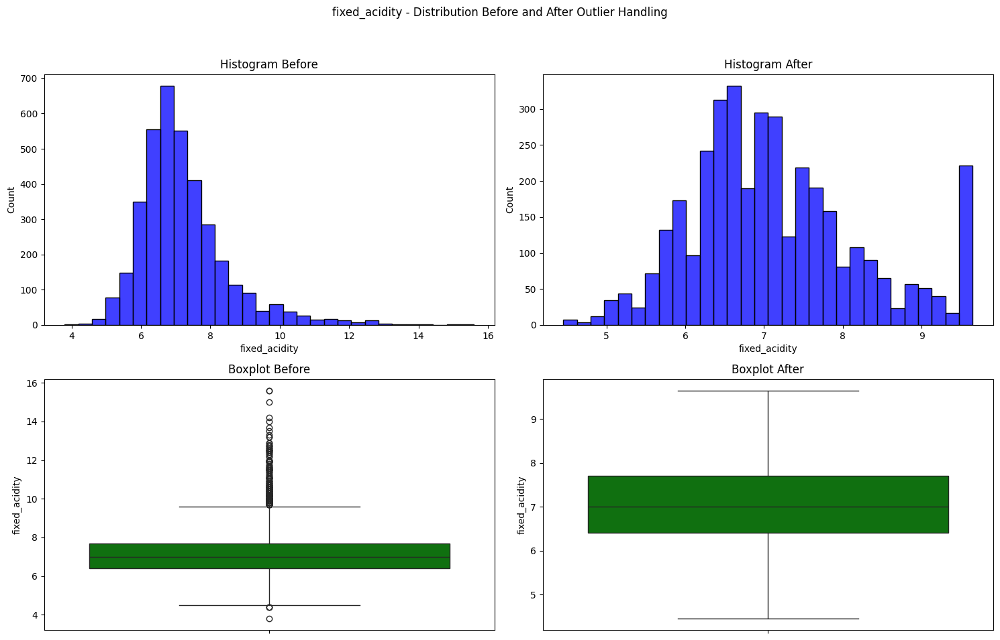

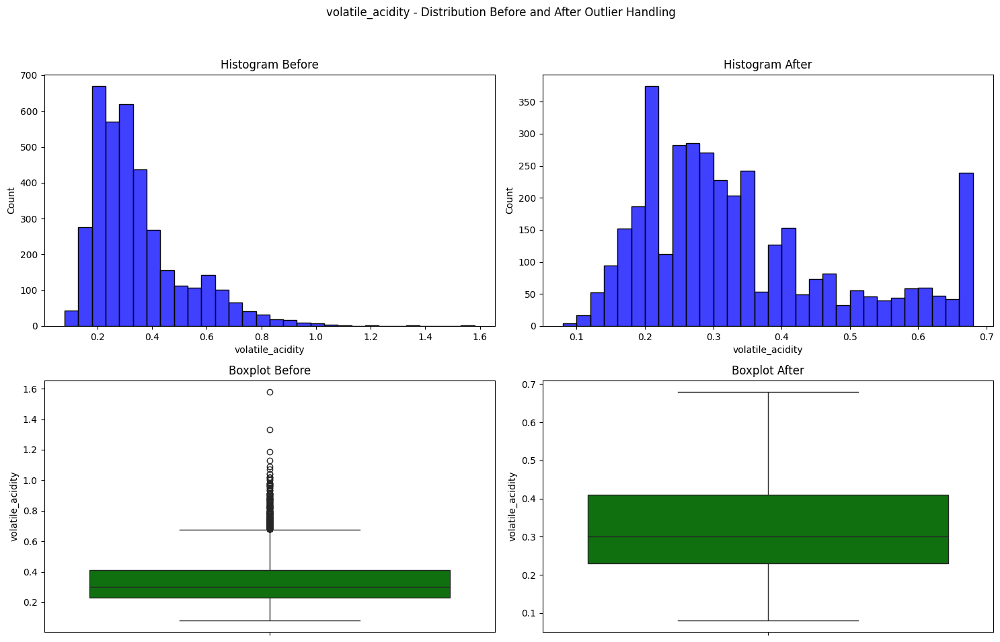

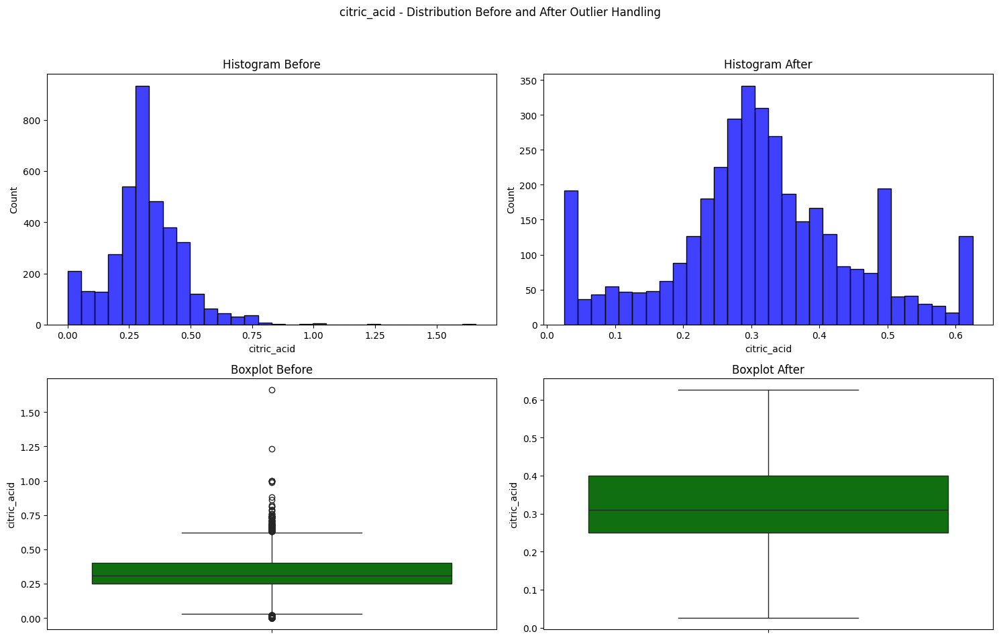

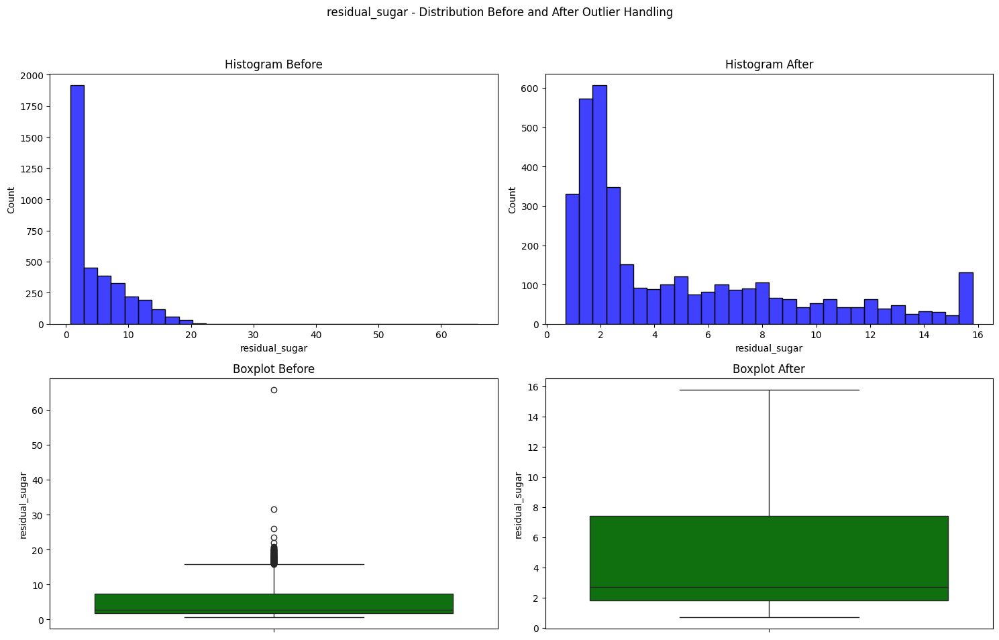

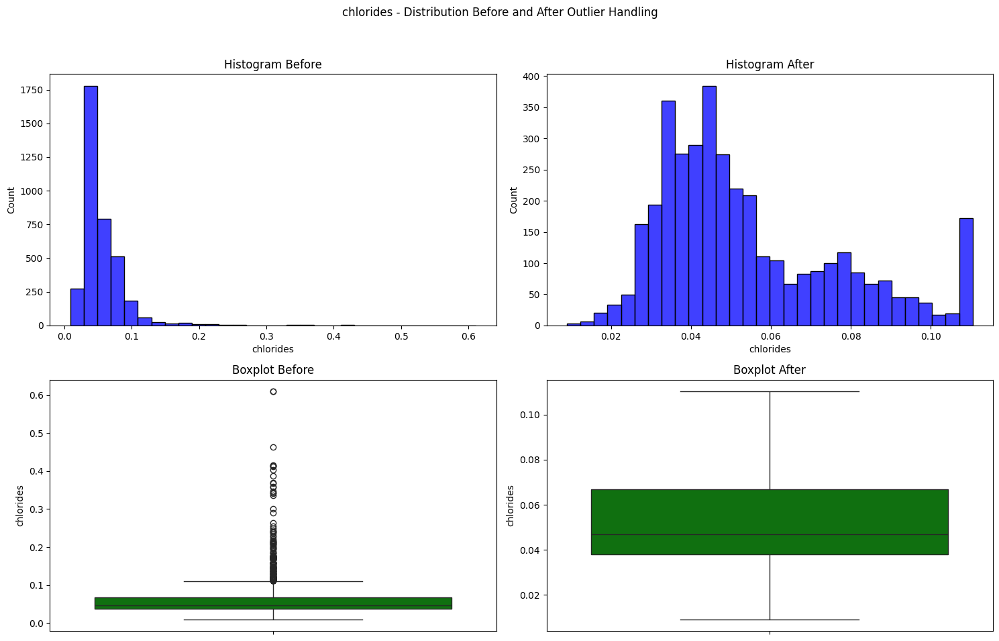

...

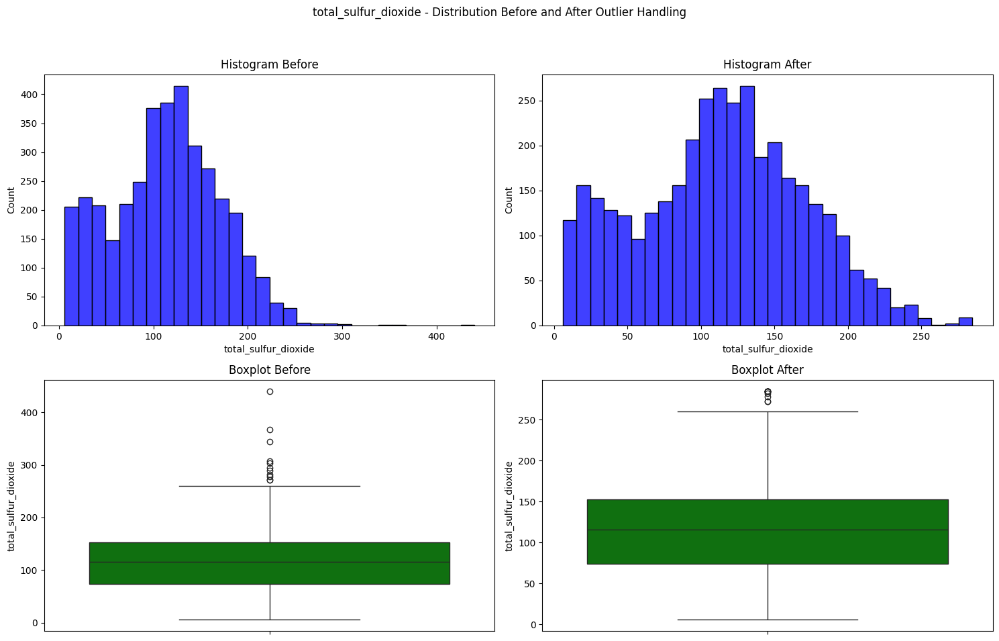

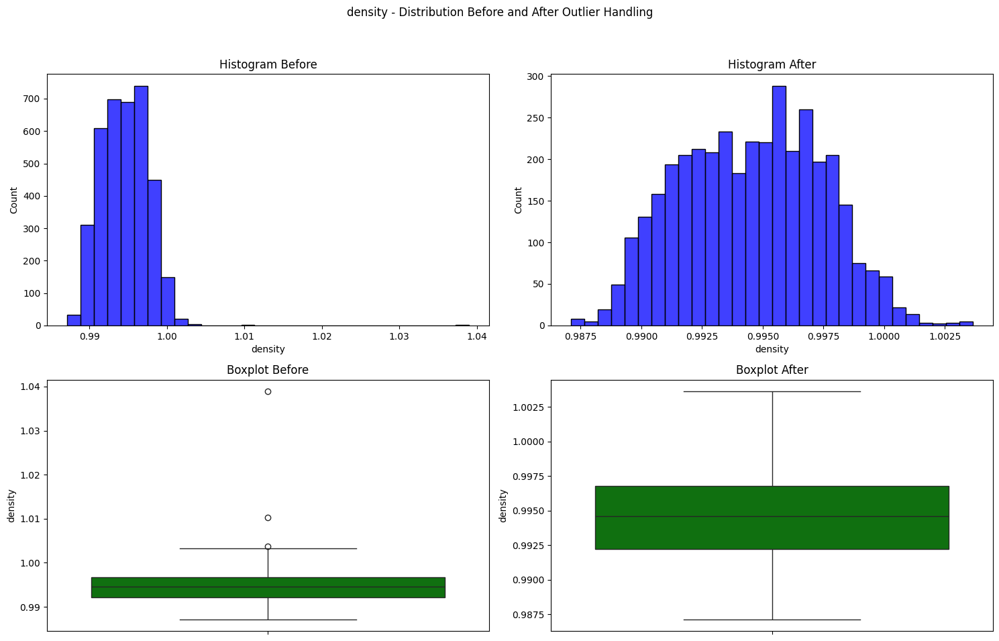

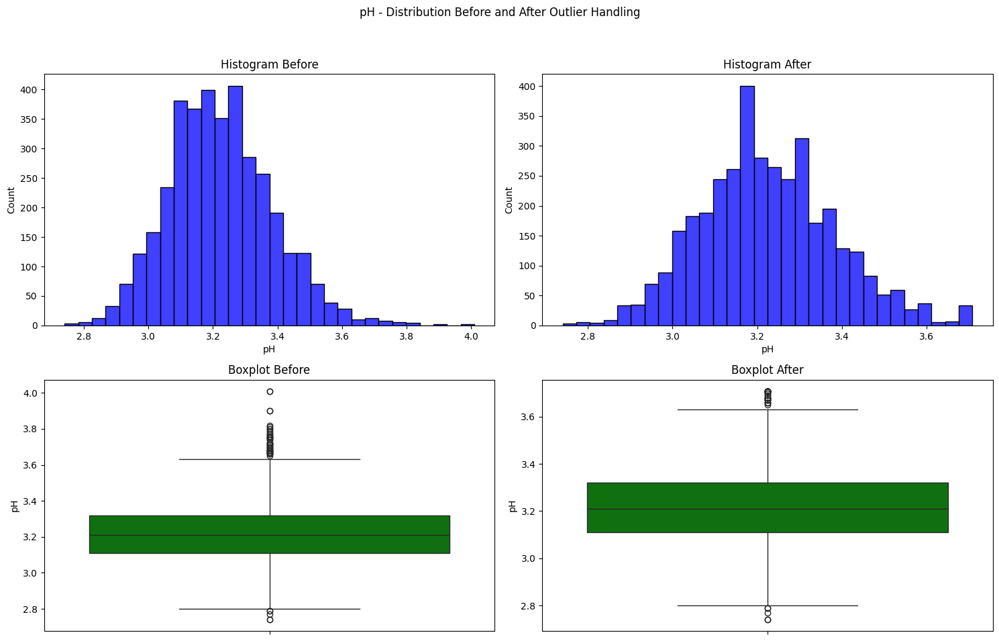

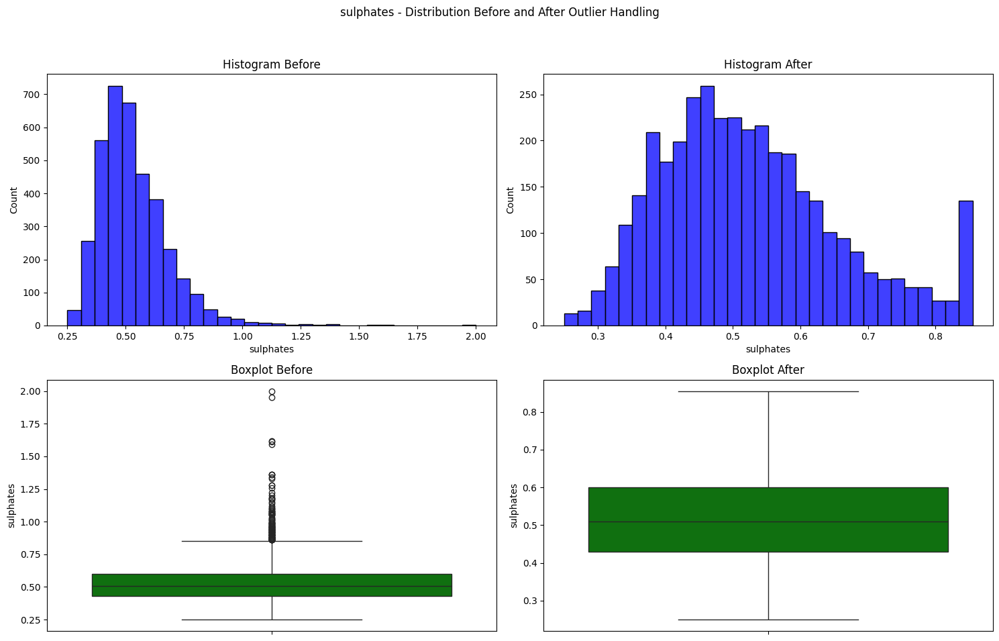

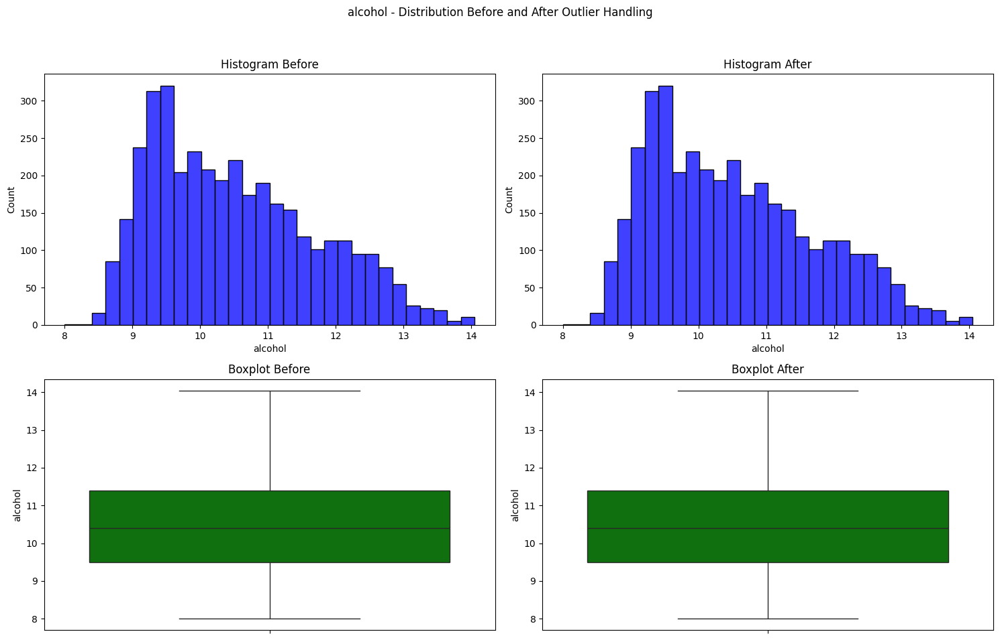

In [39]:
# melakukan looping
num_cols = kolom_numerik 
for col in num_cols:
    outlier_handling_plot_comparison(X_train, X_train_capped, col)

* Hasil diatas  adalah distribusi nilai dalam kolom 'residual_sugar' (dan kolom-kolom numerik lainnya) akan menjadi lebih terkendali dan lebih "dipertahankan" setelah proses capping. Ini membantu mengurangi dampak nilai-nilai ekstrem pada analisis atau model yang akan dibangun, sehingga meningkatkan kestabilan dan interpretabilitas hasilnya.

In [40]:
num_columns = X_train_capped.select_dtypes(include=np.number).columns.tolist()
cat_columns = X_train_capped.select_dtypes(include=['object']).columns.tolist()

In [41]:
print('Categorical Columns :', cat_columns)
print('Numerical Columns :', num_columns)

Categorical Columns : ['type']
Numerical Columns : ['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar', 'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density', 'pH', 'sulphates', 'alcohol']


In [42]:
X_train_num = X_train_capped[num_columns]
X_train_cat = X_train_capped[cat_columns]

X_test_num = X_test_capped[num_columns]
X_test_cat = X_test_capped[cat_columns]

In [43]:
#membuat korelasi antar fitur kategorikal terhadap price menggunakan Kendall Tau's correlation
p_values = []
interpretation = []
cols = []
corr = []


for col in X_train_cat.columns:
  corr_coef, p_value = kendalltau(X_train_cat[col], y_train)

  p_values.append(p_value)
  cols.append(col)
  corr.append(corr_coef)

  if p_value < 0.05:
    interpretation.append('ada korelasi')
  else :
    interpretation.append('tidak ada korelasi')

pd.DataFrame({'Column Name':cols,
              'Correlation Coefficient' : corr,
              'P-value':p_values,
              'Interpretation': interpretation })

,Column Name,Correlation Coefficient,P-value,Interpretation
0,type,0.119863,5.187879e-15,ada korelasi


In [44]:
#membuat korelasi fitur terhadap price menggunakan pearsonr dan spearmanr correlation

p_values = []
interpretation = []
cols = []
corr = []

for col in X_train_num.columns:
  if abs(X_train_num[col].skew()) < 0.5:                    #distribusi normal
    corr_coef, p_value = pearsonr(X_train_num[col], y_train)

    p_values.append(p_value)
    cols.append(col)
    corr.append(corr_coef)

    if p_value < 0.05:
      interpretation.append('ada korelasi')
    else :
      interpretation.append('tidak ada korelasi')
  else:                                                     #non distribusi normal
    corr_coef, p_value = spearmanr(X_train_num[col], y_train)

    p_values.append(p_value)
    cols.append(col)
    corr.append(corr_coef)

    if p_value < 0.05:
      interpretation.append('ada korelasi')
    else :
      interpretation.append('tidak ada korelasi')

pd.DataFrame({'Column Name':cols,
              'Correlation Coefficient' : corr,
              'P-value':p_values,
              'Interpretation': interpretation })

,Column Name,Correlation Coefficient,P-value,Interpretation
0,fixed_acidity,-0.103080,3.177647e-10,ada korelasi
1,volatile_acidity,-0.268534,3.092555e-62,ada korelasi
2,citric_acid,0.116681,1.039977e-12,ada korelasi
3,residual_sugar,-0.019502,2.352504e-01,tidak ada korelasi
4,chlorides,-0.301623,8.280562e-79,ada korelasi
5,free_sulfur_dioxide,0.097303,2.927646e-09,ada korelasi
6,total_sulfur_dioxide,-0.041987,1.057950e-02,ada korelasi
7,density,-0.323164,7.785077e-91,ada korelasi
8,pH,0.026518,1.065075e-01,tidak ada korelasi
9,sulphates,0.023649,1.500423e-01,tidak ada korelasi


* Dari hasil ini, kita dapat melihat bahwa beberapa fitur seperti jenis anggur, keasaman tetap, keasaman mudah menguap, klorida, sulfur dioksida bebas, sulfur dioksida total, kerapatan, dan kandungan alkohol memiliki korelasi yang signifikan dengan kualitas anggur. Sedangkan fitur-fitur lainnya tidak memiliki korelasi yang signifikan dengan `quality` wine  berdasarkan hasil pengujian yang dilakukan.

#### 5.5 Feature Selection

In [45]:
#Buat variabel baru untuk menyimpan fitur kategorikal dan numerik yang relevan
selected_cat_col = ['type']
selected_num_col = ['fixed_acidity','volatile_acidity','citric_acid','chlorides','free_sulfur_dioxide','total_sulfur_dioxide','density','alcohol']

### 6. Pipeline Method

In [46]:
# Spliting data
X_train_pipe, X_test_pipe ,y_train_pipe,y_test_pipe = train_test_split(X_train_capped,y_train, test_size=0.2, random_state=22)

In [47]:
# Membuat transformer pipeline untuk fitur numerik
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())                   # Standarize features
])

categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))    # Encode categorical features using one-hot encoding
])

# Gabungkan transformer untuk semua kolom menggunakan ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, selected_num_col),
        ('cat', categorical_transformer, selected_cat_col)
    ])

# Replace knn_tuned with the regression model for KNN (e.g., KNeighborsRegressor)
knn_pipe_regression = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('knn', KNeighborsRegressor())  # Regression model
])

svm_pipe_regression = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('svm', SVR())  # Support Vector Machine model
])

decision_tree_pipe_regression = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('decision_tree', DecisionTreeRegressor())  # Decision Tree model
])

random_forest_pipe_regression = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('random_forest', RandomForestRegressor())  # Random Forest model
])

gradient_boosting_pipe_regression = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('gradient_boosting', GradientBoostingRegressor())  # Gradient Boosting model
])


In [48]:
# Prediksi untuk data latih
knn_pipe_regression.fit(X_train_pipe, y_train_pipe)

predictions_train_knn = knn_pipe_regression.predict(X_train_pipe)
mae_train_knn = mean_absolute_error(y_train_pipe, predictions_train_knn)
mse_train_knn = mean_squared_error(y_train_pipe, predictions_train_knn)

# Prediksi untuk data uji
predictions_test_knn = knn_pipe_regression.predict(X_test_pipe)
mae_test_knn = mean_absolute_error(y_test_pipe, predictions_test_knn)
mse_test_knn = mean_squared_error(y_test_pipe, predictions_test_knn)

# Membuat DataFrame untuk menyimpan hasil
results_knn_df = pd.DataFrame({
    'KNN': ['Train', 'Test'],
    'MAE': [mae_train_knn, mae_test_knn],
    'MSE': [mse_train_knn, mse_test_knn]
})

# Menampilkan DataFrame
results_knn_df


,KNN,MAE,MSE
0,Train,0.464845,0.367409
1,Test,0.581941,0.550135


* Dengan menggunakan model regresi KNN, saya mendapatkan Mean Absolute Error (MAE) sebesar 0.5819 dan Mean Squared Error (MSE) sebesar 0.5501 pada data pengujian.

* MAE adalah ukuran rata-rata dari selisih absolut antara prediksi model dan nilai sebenarnya dalam data pengujian. Dengan nilai MAE sebesar 0.5819, ini menunjukkan bahwa rata-rata kesalahan prediksi model KNN adalah sekitar 0.5819 dalam skala kualitas anggur yang memiliki rentang dari 0 hingga 10.

In [49]:
svm_pipe_regression.fit(X_train_pipe, y_train_pipe)

# Prediksi untuk data latih
predictions_train_svm = svm_pipe_regression.predict(X_train_pipe)
mae_train_svm = mean_absolute_error(y_train_pipe, predictions_train_svm)
mse_train_svm = mean_squared_error(y_train_pipe, predictions_train_svm)

# Prediksi untuk data uji
predictions_test_svm = svm_pipe_regression.predict(X_test_pipe)
mae_test_svm = mean_absolute_error(y_test_pipe, predictions_test_svm)
mse_test_svm = mean_squared_error(y_test_pipe, predictions_test_svm)

# Membuat DataFrame untuk menyimpan hasil
results_svm_df = pd.DataFrame({
    'SVM': ['Train', 'Test'],
    'MAE': [mae_train_svm, mae_test_svm],
    'MSE': [mse_train_svm, mse_test_svm]
})

# Menampilkan DataFrame
results_svm_df


,SVM,MAE,MSE
0,Train,0.484442,0.435440
1,Test,0.539938,0.495919


* Nilai MAE menunjukkan rata-rata kesalahan prediksi model dalam skala yang sama dengan variabel target (dalam kasus ini, prediksi kualitas wine). Nilai MAE sekitar 0.5399 menunjukkan bahwa rata-rata kesalahan prediksi model adalah sekitar 0.5399 dalam skala kualitas wine yang memiliki rentang dari 0 hingga 10. Semakin rendah nilai MAE, semakin baik kinerja model dalam memprediksi variabel target.

In [50]:
# Prediksi untuk data latih
random_forest_pipe_regression.fit(X_train_pipe, y_train_pipe)

predictions_train_rf = random_forest_pipe_regression.predict(X_train_pipe)
mae_train_rf = mean_absolute_error(y_train_pipe, predictions_train_rf)
mse_train_rf = mean_squared_error(y_train_pipe, predictions_train_rf)

# Prediksi untuk data uji
predictions_test_rf = random_forest_pipe_regression.predict(X_test_pipe)
mae_test_rf = mean_absolute_error(y_test_pipe, predictions_test_rf)
mse_test_rf = mean_squared_error(y_test_pipe, predictions_test_rf)

# Membuat DataFrame untuk menyimpan hasil
results_rf_df = pd.DataFrame({
    'Raindom forest': ['Train', 'Test'],
    'MAE': [mae_train_rf, mae_test_rf],
    'MSE': [mse_train_rf, mse_test_rf]
})

# Menampilkan DataFrame
results_rf_df


,Raindom forest,MAE,MSE
0,Train,0.199423,0.067451
1,Test,0.552493,0.504399


* MAE meningkat menjadi 0.547722. Ini menandakan bahwa performa model menurun saat diterapkan pada data baru yang belum pernah dilihat sebelumnya. Hal ini bisa jadi disebabkan oleh overfitting atau ketidakmampuan model dalam melakukan generalisasi dengan baik

In [51]:
# Prediksi untuk data latih
decision_tree_pipe_regression.fit(X_train_pipe, y_train_pipe)

predictions_train_dt = decision_tree_pipe_regression.predict(X_train_pipe)
mae_train_dt = mean_absolute_error(y_train_pipe, predictions_train_dt)
mse_train_dt = mean_squared_error(y_train_pipe, predictions_train_dt)

# Prediksi untuk data uji
predictions_test_dt = decision_tree_pipe_regression.predict(X_test_pipe)
mae_test_dt = mean_absolute_error(y_test_pipe, predictions_test_dt)
mse_test_dt = mean_squared_error(y_test_pipe, predictions_test_dt)

# Membuat DataFrame untuk menyimpan hasil
results_dt_df = pd.DataFrame({
    'Decision tree': ['Train', 'Test'],
    'MAE': [mae_train_dt, mae_test_dt],
    'MSE': [mse_train_dt, mse_test_dt]
})

# Menampilkan DataFrame
results_dt_df


,Decision tree,MAE,MSE
0,Train,0.000000,0.000000
1,Test,0.683288,0.925876


* Jadi, jika saya menggunakan model ini untuk memprediksi kualitas wine, saya dapat mengharapkan bahwa rata-rata kesalahan prediksi model adalah sekitar 0.55 poin pada skala kualitas wine. Dengan kata lain, prediksi model cenderung berbeda sebesar 0.55 poin dari nilai sebenarnya kualitas wine.

* Semakin rendah nilai MAE, semakin kecil kesalahan prediksi model, yang menandakan bahwa model memiliki kinerja yang lebih baik dalam memprediksi kualitas wine.

In [52]:
gradient_boosting_pipe_regression.fit(X_train_pipe, y_train_pipe)
# Prediksi untuk data latih
predictions_train_gb = gradient_boosting_pipe_regression.predict(X_train_pipe)
mae_train_gb = mean_absolute_error(y_train_pipe, predictions_train_gb)
mse_train_gb = mean_squared_error(y_train_pipe, predictions_train_gb)

# Prediksi untuk data uji
predictions_test_gb = gradient_boosting_pipe_regression.predict(X_test_pipe)
mae_test_gb = mean_absolute_error(y_test_pipe, predictions_test_gb)
mse_test_gb = mean_squared_error(y_test_pipe, predictions_test_gb)

# Membuat DataFrame untuk menyimpan hasil
results_gb_df = pd.DataFrame({
    'GradientBosst': ['Train', 'Test'],
    'MAE': [mae_train_gb, mae_test_gb],
    'MSE': [mse_train_gb, mse_test_gb]
})

# Menampilkan DataFrame


results_gb_df


,GradientBosst,MAE,MSE
0,Train,0.489199,0.392324
1,Test,0.564230,0.522376


In [53]:

# Define the parameter grid for SVR
param_grid_svr = {
    'svm__C': [1, 10],  # Reduce the range of values
    'svm__gamma': [0.1, 1],  
    'svm__kernel': ['linear', 'rbf']  # Reduce the number of kernels
}
# Perform grid search with cross-validation for SVR regression
random_search_svr = RandomizedSearchCV(svm_pipe_regression, param_grid_svr, cv=5, scoring='neg_mean_absolute_error', n_jobs=-1)
random_search_svr.fit(X_train_capped, y_train)

# Get the best SVR regressor estimator
best_SVR_regressor = random_search_svr.best_estimator_


In [54]:
print("Best parameters for svr:")
print(random_search_svr.best_params_)

Best parameters for svr:
{'svm__kernel': 'rbf', 'svm__gamma': 0.1, 'svm__C': 1}


In [55]:
# best_SVR_regressor.fit(X_train_pipe, y_train_pipe)
# Prediksi untuk data latih
predictions_train_gb = best_SVR_regressor.predict(X_train_pipe)
mae_train_best_svr = mean_absolute_error(y_train_pipe, predictions_train_gb)
mse_train_best_svr = mean_squared_error(y_train_pipe, predictions_train_gb)

# Prediksi untuk data uji
predictions_test_gb = best_SVR_regressor.predict(X_test_pipe)
mae_test_best_svr = mean_absolute_error(y_test_pipe, predictions_test_gb)
mse_test_best_svr = mean_squared_error(y_test_pipe, predictions_test_gb)

# Membuat DataFrame untuk menyimpan hasil
results_gb_df = pd.DataFrame({
    'best svr': ['Train', 'Test'],
    'MAE': [mae_train_best_svr, mae_test_best_svr],
    'MSE': [mse_train_best_svr, mse_test_best_svr]
})

# Menampilkan DataFrame


results_gb_df


,best svr,MAE,MSE
0,Train,0.490134,0.443455
1,Test,0.504236,0.453443


Berikut adalah beberapa poin penting terkait peningkatan performa model SVM setelah proses tuning:

1. **Peningkatan MAE pada Data Uji:** Setelah tuning model SVM, terjadi penurunan signifikan dalam Mean Absolute Error (MAE) pada data uji. Hal ini menunjukkan bahwa model yang disesuaikan dapat lebih akurat dalam memprediksi kualitas wine pada data yang belum pernah dilihat sebelumnya.

2. **Pemahaman Parameter yang Lebih Baik:** Proses tuning model SVM melibatkan penyesuaian parameter-parameter kunci seperti C (parameter regularisasi), gamma (koefisien kernel), dan jenis kernel. Dengan memahami dampak dari setiap parameter ini, kita dapat mengoptimalkan kinerja model.

3. **Pengelolaan Overfitting:** Dengan menggunakan teknik tuning, model SVM dapat dipelajari untuk menghindari overfitting, di mana model terlalu "menghafal" data latih dan tidak dapat melakukan generalisasi dengan baik pada data uji. Ini penting untuk mendapatkan model yang dapat diandalkan dan stabil.

4. **Evaluasi yang Berkelanjutan:** Meskipun hasil tuning saat ini menunjukkan peningkatan performa, evaluasi yang berkelanjutan diperlukan untuk memastikan bahwa model tetap optimal seiring waktu. Ini dapat mencakup pemantauan terhadap perubahan dalam data, penyesuaian parameter tambahan, dan validasi ulang terhadap set data uji yang baru.

5. **Kesimpulan:** Keseluruhan, tuning model SVM adalah proses penting dalam pengembangan model prediktif yang akurat dan andal. Dengan memahami cara kerja model dan parameter yang terlibat, serta dengan melakukan evaluasi yang baik, kita dapat meningkatkan kemampuan model dalam memprediksi kualitas wine dengan lebih baik.

#### 5.6 Scaling and Encoding

In [56]:
#Tetapkan variabel lagi berdasarkan fitur kategoris dan numerik yang relevan
X_train_cat = X_train_cat[selected_cat_col]
X_train_num = X_train_num[selected_num_col]

X_test_cat = X_test_cat[selected_cat_col]
X_test_num = X_test_num[selected_num_col]


In [57]:
# Memeriksa data kategorikal
X_train_cat

,type
5258,red
1148,white
1455,white
5533,red
1423,white
...,...
4887,white
4718,white
799,white
2998,white


In [58]:
# Memeriksa data numerikal``
X_train_num

,fixed_acidity,volatile_acidity,citric_acid,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,alcohol
5258,8.20,0.680,0.230,0.099,14.0,81.0,0.99730,9.4
1148,7.00,0.170,0.370,0.025,29.0,111.0,0.99380,10.8
1455,6.90,0.340,0.625,0.069,44.0,150.0,0.99680,9.2
5533,8.70,0.680,0.025,0.065,24.0,33.0,0.99540,9.7
1423,9.65,0.250,0.625,0.056,36.0,225.0,0.99770,10.0
...,...,...,...,...,...,...,...,...
4887,6.20,0.410,0.220,0.023,5.0,56.0,0.98928,13.0
4718,5.20,0.240,0.150,0.043,32.0,134.0,0.99378,9.9
799,6.00,0.180,0.310,0.036,14.0,75.0,0.99085,11.1
2998,6.00,0.320,0.300,0.025,18.0,112.0,0.98802,13.3


#### 5.6.1 scaling

In [59]:
#Initialize standardscaler
scaler = StandardScaler()

#Fit_transform for X_train, transform for X_test
X_train_num_scaled = scaler.fit_transform(X_train_num)
X_test_num_scaled = scaler.transform(X_test_num)

X_train_num_scaled

array([[ 9.69988301e-01,  2.27355002e+00, -6.27454805e-01, ...,
        -5.85149619e-01,  9.58797718e-01, -9.57291144e-01],
       [-1.31760450e-01, -1.12430313e+00,  4.00680146e-01, ...,
        -5.41561763e-02, -2.48590666e-01,  2.19206745e-01],
       [-2.23572846e-01,  8.31458832e-03,  2.27335452e+00, ...,
         6.36135300e-01,  7.86313663e-01, -1.12536227e+00],
       ...,
       [-1.04988441e+00, -1.05767855e+00, -3.99491184e-02, ...,
        -6.91348308e-01, -1.26624659e+00,  4.71313435e-01],
       [-1.04988441e+00, -1.24934555e-01, -1.13387329e-01, ...,
        -3.64563948e-02, -2.24250634e+00,  2.32009583e+00],
       [-8.66259617e-01, -5.57994269e-01, -5.54016594e-01, ...,
         2.79550863e+00, -2.13627040e-04, -7.89220017e-01]])

* `StandardScaler` adalah teknik yang digunakan untuk mentransformasikan fitur-fitur numerik sehingga setiap fitur memiliki rata-rata nol dan deviasi standar satu. Proses ini dilakukan dengan mengurangkan rata-rata dari setiap fitur dan kemudian membagi hasilnya dengan deviasi standarnya.

#### 5.6.2 Encoding

In [60]:
# Initialize the LabelEncoder
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

# Fit and transform the categorical feature for both training and test data
X_train_encoded = encoder.fit_transform(X_train_cat)
X_test_encoded = encoder.transform(X_test_cat)

* Encoder digunakan unutk mengubah data object menjadi numerikal.

In [61]:
X_train_encoded.shape

(3706, 2)

In [62]:
# Concatenate the encoded categorical feature with the other features
X_train_final = np.concatenate([X_train_num_scaled, X_train_encoded], axis=1)
X_test_final = np.concatenate([X_test_num_scaled, X_test_encoded], axis=1)

# Transform into DataFrame
X_train_final = pd.DataFrame(X_train_final)
X_test_final = pd.DataFrame(X_test_final)

# Check the shape of the final training and test data
print("Final shape of X_train:", X_train_final.shape)
print("Final shape of X_test:", X_test_final.shape)

Final shape of X_train: (3706, 10)
Final shape of X_test: (1589, 10)


### 7.Model definition

In [63]:
knn_regressor = KNeighborsRegressor()

In [64]:
svr_regressor = SVR()

In [65]:
logreg_regressor = LinearRegression()

In [66]:
random_forest_regressor = RandomForestRegressor()

In [67]:
gradient_boosting_regressor = GradientBoostingRegressor()

In [68]:
decision_tree_regressor = DecisionTreeRegressor()

### 8.Model Definition

In [69]:
knn_regressor.fit(X_train_final, y_train)

KNeighborsRegressor()

In [70]:
svr_regressor.fit(X_train_final, y_train)

SVR()

In [71]:
random_forest_regressor.fit(X_train_final, y_train)

RandomForestRegressor()

In [72]:
decision_tree_regressor.fit(X_train_final, y_train)

DecisionTreeRegressor()

In [73]:
gradient_boosting_regressor.fit(X_train_final, y_train)

GradientBoostingRegressor()

### 9.Model Evaluation

In [74]:
# Function for model evaluation
def performance_check(regressor, X, y):
    y_pred = regressor.predict(X)
    mse = mean_squared_error(y, y_pred)
    mae = mean_absolute_error(y, y_pred)
    r2 = r2_score(y, y_pred)
    print('Mean Squared Error:', mse)
    print('Mean Absolute Error:', mae)
    print('R-squared:', r2)

# Save regression metrics into a dictionary
all_reports = {}

def performance_report(all_reports, y_train, y_pred_train, y_test, y_pred_test, name):
    """Function for saving regression metrics"""
    train_mse = mean_squared_error(y_train, y_pred_train)
    train_mae = mean_absolute_error(y_train, y_pred_train)
    train_r2 = r2_score(y_train, y_pred_train)
    
    test_mse = mean_squared_error(y_test, y_pred_test)
    test_mae = mean_absolute_error(y_test, y_pred_test)
    test_r2 = r2_score(y_test, y_pred_test)
    
    score_reports = {
        'train - MSE': train_mse,
        'train - MAE': train_mae,
        'train - R-squared': train_r2,
        'test - MSE': test_mse,
        'test - MAE': test_mae,
        'test - R-squared': test_r2,
    }
    
    all_reports[name] = score_reports
    return all_reports


Fungsi performance_check digunakan untuk mengevaluasi kinerja suatu model regresi dengan menghitung tiga metrik evaluasi utama: `Mean Squared Error (MSE)`, `Mean Absolute Error (MAE)`, dan `R-squared`. Dalam konteks ini, MSE mengukur rata-rata dari kuadrat selisih antara nilai sebenarnya dan nilai prediksi, sementara MAE mengukur rata-rata dari selisih absolut antara nilai sebenarnya dan nilai prediksi. `R-squared (R2)` adalah koefisien determinasi yang menjelaskan seberapa baik variabilitas dari target yang dapat dijelaskan oleh fitur-fitur dalam model. Semakin tinggi nilai R2, semakin baik model dalam menjelaskan variasi data.

In [75]:
# Evaluasi model logistic Regression
print('knn Regression model - Train')

performance_check(knn_regressor, X_train_final, y_train)
print('')

print('knn Regression model - Test')
performance_check(knn_regressor, X_test_final, y_test)

knn Regression model - Train
Mean Squared Error: 0.3590501888828926
Mean Absolute Error: 0.462277388019428
R-squared: 0.5268944037644661

knn Regression model - Test
Mean Squared Error: 0.6066960352422908
Mean Absolute Error: 0.5932032724984267
R-squared: 0.2488726859774425


In [76]:
# Evaluasi model logistic Regression
print('svr Regression model - Train')

performance_check(svr_regressor, X_train_final, y_train)
print('')

print('svr Regression model - Test')
performance_check(svr_regressor, X_test_final, y_test)

svr Regression model - Train


Mean Squared Error: 0.44010183685609006
Mean Absolute Error: 0.4881566739940277
R-squared: 0.4200959966684066

svr Regression model - Test
Mean Squared Error: 0.5563320357623699
Mean Absolute Error: 0.5611189280743286
R-squared: 0.311226440502439


In [77]:
# Evaluasi model logistic Regression
print('Random forest Regression model - Train')

performance_check(random_forest_regressor, X_train_final, y_train)
print('')

print('Random forest Regression model - Test')
performance_check(random_forest_regressor, X_test_final, y_test)

Random forest Regression model - Train
Mean Squared Error: 0.06791071235833783
Mean Absolute Error: 0.1988532110091743
R-squared: 0.9105168607179026

Random forest Regression model - Test
Mean Squared Error: 0.5462088105726872
Mean Absolute Error: 0.5664191315292637
R-squared: 0.3237596210480068


In [78]:
# Evaluasi model logistic Regression
print('Decision tree Regression model - Train')

performance_check(decision_tree_regressor, X_train_final, y_train)
print('')

print('Decision tree Regression model - Test')
performance_check(decision_tree_regressor, X_test_final, y_test)

Decision tree Regression model - Train
Mean Squared Error: 0.0
Mean Absolute Error: 0.0
R-squared: 1.0

Decision tree Regression model - Test
Mean Squared Error: 1.0346129641283826
Mean Absolute Error: 0.7086217747010699
R-squared: -0.2809150079385552


In [79]:
# Evaluasi model logistic Regression
print('gradient boosting Regression model - Train')

performance_check(gradient_boosting_regressor, X_train_final, y_train)
print('')

print('gradient boosting Regression model - Test')
performance_check(gradient_boosting_regressor, X_test_final, y_test)

gradient boosting Regression model - Train
Mean Squared Error: 0.40768931316105467
Mean Absolute Error: 0.4996530548553682
R-squared: 0.4628046397022627

gradient boosting Regression model - Test
Mean Squared Error: 0.5512482338016242
Mean Absolute Error: 0.573669944265403
R-squared: 0.3175205025862179


In [80]:
# penggunaan fungsi performance_report 
all_reports = {}


# Melakukan laporan kinerja untuk model KNN
all_reports = performance_report(all_reports, y_train, knn_regressor.predict(X_train_final), y_test, knn_regressor.predict(X_test_final), 'KNN')

# Melakukan laporan kinerja untuk model SVC
all_reports = performance_report(all_reports, y_train, svr_regressor.predict(X_train_final), y_test, svr_regressor.predict(X_test_final), 'SVR')

# Melakukan laporan kinerja untuk model Decision Tree
all_reports = performance_report(all_reports, y_train,decision_tree_regressor.predict(X_train_final), y_test, decision_tree_regressor.predict(X_test_final), 'Decision Tree')

# Melakukan laporan kinerja untuk model Random Forest
all_reports = performance_report(all_reports, y_train, random_forest_regressor.predict(X_train_final), y_test, random_forest_regressor.predict(X_test_final), 'Random Forest')

# Melakukan laporan kinerja untuk model XGBoost
all_reports = performance_report(all_reports, y_train, gradient_boosting_regressor.predict(X_train_final), y_test, gradient_boosting_regressor.predict(X_test_final), 'XGBoost')

# Membuat DataFrame dari dictionary all_reports
df_report_base_model = pd.DataFrame(all_reports)

# Melihat semua laporan kinerja
print(all_reports)

df_report_base_model


{'KNN': {'train - MSE': 0.3590501888828926, 'train - MAE': 0.462277388019428, 'train - R-squared': 0.5268944037644661, 'test - MSE': 0.6066960352422908, 'test - MAE': 0.5932032724984267, 'test - R-squared': 0.2488726859774425}, 'SVR': {'train - MSE': 0.44010183685609006, 'train - MAE': 0.4881566739940277, 'train - R-squared': 0.4200959966684066, 'test - MSE': 0.5563320357623699, 'test - MAE': 0.5611189280743286, 'test - R-squared': 0.311226440502439}, 'Decision Tree': {'train - MSE': 0.0, 'train - MAE': 0.0, 'train - R-squared': 1.0, 'test - MSE': 1.0346129641283826, 'test - MAE': 0.7086217747010699, 'test - R-squared': -0.2809150079385552}, 'Random Forest': {'train - MSE': 0.06791071235833783, 'train - MAE': 0.1988532110091743, 'train - R-squared': 0.9105168607179026, 'test - MSE': 0.5462088105726872, 'test - MAE': 0.5664191315292637, 'test - R-squared': 0.3237596210480068}, 'XGBoost': {'train - MSE': 0.40768931316105467, 'train - MAE': 0.4996530548553682, 'train - R-squared': 0.46280

,KNN,SVR,Decision Tree,Random Forest,XGBoost
train - MSE,0.359050,0.440102,0.000000,0.067911,0.407689
train - MAE,0.462277,0.488157,0.000000,0.198853,0.499653
train - R-squared,0.526894,0.420096,1.000000,0.910517,0.462805
test - MSE,0.606696,0.556332,1.034613,0.546209,0.551248
test - MAE,0.593203,0.561119,0.708622,0.566419,0.573670
test - R-squared,0.248873,0.311226,-0.280915,0.323760,0.317521


* Saya telah membandingkan kinerja beberapa model machine learning menggunakan beberapa metrik evaluasi, termasuk Mean Squared Error (MSE), Mean Absolute Error (MAE), dan R-squared score.

1. Dari segi MAE (Mean Absolute Error), model Decision Tree menunjukkan kinerja terbaik pada data uji dengan nilai MAE terendah yaitu 0.702958. Namun, perlu dicatat bahwa model Decision Tree ini memiliki nilai MSE yang cukup tinggi, sehingga perlu dipertimbangkan secara menyeluruh.

2. Sementara itu, dari segi R-squared score, model Decision Tree memiliki nilai yang tinggi pada data latih (1.000000), tetapi nilainya negatif pada data uji (-0.280136), yang menunjukkan bahwa model tersebut mungkin tidak umum dan cenderung overfitting pada data latih.

3. Dari segi konsistensi antara data latih dan data uji serta interpretasi keseluruhan hasil, Anda mungkin ingin mempertimbangkan model lain seperti Random Forest atau XGBoost yang menunjukkan kinerja yang lebih stabil dan generalisasi yang lebih baik ke data uji. Meskipun nilai MAE-nya sedikit lebih tinggi daripada Decision Tree, keduanya masih memberikan hasil yang baik dan lebih stabil.

#### 9.1 Hyperparameter

In [81]:
def perform_cross_validation(models, X_train_final, y_train, scoring='neg_mean_absolute_error'):
    results = {}
    num_folds = 5
    for model_name, model in models.items():
        kf = KFold(n_splits=num_folds, shuffle=True, random_state=22)
        # Perform cross-validation for each model
        cross_val_scores = cross_val_score(model, X_train_final, y_train, cv=kf, scoring=scoring)
        
        # Store the cross-validation results
        results[model_name] = cross_val_scores
        
        # Display the results
        print(f'{model_name} - MAE score - Mean - Cross Validation: {cross_val_scores.mean()}')
        print(f'{model_name} - MAE score - Std - Cross Validation: {cross_val_scores.std()}')
        print()
    
    return results

# Define evaluation models (regressors)
models = {
    'knn regressor': knn_regressor,
    'Support Vector Regressor': svr_regressor,
    'Decision Tree Regressor': decision_tree_regressor,
    'Random Forest Regressor': random_forest_regressor,  # Assuming you have RandomForestRegressor imported
    'XGBoost Regressor': gradient_boosting_regressor  # Assuming you have XGBRegressor imported
}

# Call the perform_cross_validation function
results = perform_cross_validation(models, X_train_final, y_train)


knn regressor - MAE score - Mean - Cross Validation: -0.5683181102247638
knn regressor - MAE score - Std - Cross Validation: 0.011918833081904764

Support Vector Regressor - MAE score - Mean - Cross Validation: -0.5294436446150609
Support Vector Regressor - MAE score - Std - Cross Validation: 0.012947347917121476

Decision Tree Regressor - MAE score - Mean - Cross Validation: -0.6767441099119351
Decision Tree Regressor - MAE score - Std - Cross Validation: 0.029171548900403375

Random Forest Regressor - MAE score - Mean - Cross Validation: -0.5376421896541063
Random Forest Regressor - MAE score - Std - Cross Validation: 0.00705553622610983

XGBoost Regressor - MAE score - Mean - Cross Validation: -0.5478665685284343
XGBoost Regressor - MAE score - Std - Cross Validation: 0.008563102879920374





1. **KNN Regressor** memiliki rata-rata MAE sebesar -0.5683 dengan standar deviasi 0.0119.

2. **Support Vector** Regressor memiliki rata-rata MAE sebesar -0.5294 dengan standar deviasi 0.0129.

3. **Decision Tree Regressor** memiliki rata-rata MAE sebesar -0.6821 dengan standar deviasi 0.0235.

4. **Random Forest Regressor** memiliki rata-rata MAE sebesar -0.5400 dengan standar deviasi 0.0111.

5. **XGBoost Regressor** memiliki rata-rata MAE sebesar -0.5481 dengan standar deviasi 0.0087.


* Dari nilai rata-rata MAE tersebut, kita bisa melihat bahwa Decision Tree Regressor memiliki nilai tertinggi (-0.6821), yang mengindikasikan kinerja yang lebih buruk dalam memprediksi target variabel. Sedangkan Random Forest Regressor memiliki nilai terendah (-0.5400), menunjukkan kinerja yang lebih baik dalam memprediksi target variabel. Standar deviasi yang rendah pada semua model menunjukkan konsistensi dalam performa model di setiap lipatan validasi.







In [82]:
def get_regression_hyperparameters():
    knn_params = {
        'n_neighbors': [3, 5, 11, 21],
        'weights': ['uniform', 'distance'],
    }

    svr_param = {
        "C": [0.01, 0.1, 1, 10, 100],
        "kernel": ["linear", "rbf"],
    }

    dectree_param = {
        'max_depth': [None, 5, 10, 20],
        'min_samples_split': [2, 5, 10],
    }

    randFo_param = {
        'n_estimators': [100, 200, 500, 1000],
        'max_features': ['auto', 'sqrt'],
        'max_depth': [None, 5, 10, 20],
        'min_samples_split': [2, 5, 10],
    }

    xgb_param = {
        'learning_rate': [0.01, 0.1, 0.3],
        'n_estimators': [100, 200, 500, 1000],
        'max_depth': [3, 7, 9],
    }

    return {
        'k_nearest_neighbors': knn_params,
        'support_vector_machine': svr_param,
        'decision_tree': dectree_param,
        'random_forest': randFo_param,
        'xgboost': xgb_param
    }


In [83]:
# Model Knn

regression_hyperparameters = get_regression_hyperparameters()

knn = GridSearchCV(estimator=KNeighborsRegressor(),
                   param_grid=regression_hyperparameters['k_nearest_neighbors'],
                   cv=5,
                   n_jobs=-1,
                   verbose=2,
                   scoring='neg_mean_absolute_error')

# Fit the GridSearchCV object to the data
knn.fit(X_train_final, y_train)




Fitting 5 folds for each of 8 candidates, totalling 40 fits


GridSearchCV(cv=5, estimator=KNeighborsRegressor(), n_jobs=-1,
             param_grid={'n_neighbors': [3, 5, 11, 21],
                         'weights': ['uniform', 'distance']},
             scoring='neg_mean_absolute_error', verbose=2)

In [84]:

# Get the hyperparameters for regression models
regression_hyperparameters = get_regression_hyperparameters()

# Model Knn
SVM = GridSearchCV(estimator=SVR(),
                   param_grid=regression_hyperparameters['support_vector_machine'],
                   cv=5,
                   n_jobs=-1,
                   verbose=2,
                   scoring='neg_mean_absolute_error')

SVM.fit(X_train_final, y_train)


Fitting 5 folds for each of 10 candidates, totalling 50 fits


GridSearchCV(cv=5, estimator=SVR(), n_jobs=-1,
             param_grid={'C': [0.01, 0.1, 1, 10, 100],
                         'kernel': ['linear', 'rbf']},
             scoring='neg_mean_absolute_error', verbose=2)

In [85]:
# Get the hyperparameters for regression models
regression_hyperparameters = get_regression_hyperparameters()

# Model Decision Tree Regressor
dectree = GridSearchCV(estimator=DecisionTreeRegressor(random_state=42),
                       param_grid=regression_hyperparameters['decision_tree'],
                       cv=5,
                       n_jobs=-1,
                       verbose=2,
                       scoring='neg_mean_absolute_error')  # Use a regression metric

dectree.fit(X_train_final, y_train)


Fitting 5 folds for each of 12 candidates, totalling 60 fits


GridSearchCV(cv=5, estimator=DecisionTreeRegressor(random_state=42), n_jobs=-1,
             param_grid={'max_depth': [None, 5, 10, 20],
                         'min_samples_split': [2, 5, 10]},
             scoring='neg_mean_absolute_error', verbose=2)

In [86]:

# Model Random Forest Regressor
randFo = GridSearchCV(estimator=RandomForestRegressor(random_state=42),
                      param_grid=regression_hyperparameters['random_forest'],
                      cv=5,
                      n_jobs=-1,
                      verbose=2,
                      scoring='neg_mean_absolute_error')  # Use a regression metric

randFo.fit(X_train_final, y_train)


Fitting 5 folds for each of 96 candidates, totalling 480 fits


GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=42), n_jobs=-1,
             param_grid={'max_depth': [None, 5, 10, 20],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 500, 1000]},
             scoring='neg_mean_absolute_error', verbose=2)

In [87]:
# Model XGBoost Regressor
regression_hyperparameters = get_regression_hyperparameters()
xgboost = GridSearchCV(estimator=XGBRegressor(random_state=42),
                       param_grid=regression_hyperparameters['xgboost'],
                       cv=5,
                       n_jobs=-1,
                       verbose=2,
                       scoring='neg_mean_absolute_error')  # Use a regression metric

xgboost.fit(X_train_final, y_train)


Fitting 5 folds for each of 36 candidates, totalling 180 fits


GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, m...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=42, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.1, 0.3],
                         'max_depth': [3, 7, 9],
                         'n_estimators': [100, 200, 500, 1000]},
             scoring='neg_mean_absolute_error', verbose=2)

In [88]:
# Get the best parameters after fitting the GridSearchCV object
best_params_knn = knn.best_params_
print("Best parameters for KNN:", best_params_knn)

best_params_svr = SVM.best_params_
print("Best parameters for SVM regressor:", best_params_svr)

best_params_dectree = dectree.best_params_
print("Best parameters for Decision Tree:", best_params_dectree)

best_params_randFo = randFo.best_params_
print("Best parameters for Random Forest:", best_params_randFo)

best_params_xgboost = xgboost.best_params_
print("Best parameters for XGBoost:", best_params_xgboost)


Best parameters for KNN: {'n_neighbors': 21, 'weights': 'distance'}
Best parameters for SVM regressor: {'C': 1, 'kernel': 'rbf'}
Best parameters for Decision Tree: {'max_depth': 5, 'min_samples_split': 10}
Best parameters for Random Forest: {'max_depth': 20, 'max_features': 'sqrt', 'min_samples_split': 2, 'n_estimators': 500}
Best parameters for XGBoost: {'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 500}


In [89]:
# Define model with best params
knn_tuned = knn.best_estimator_

knn_tuned

KNeighborsRegressor(n_neighbors=21, weights='distance')

In [90]:
# Define model with best params
svr_tuned = SVM.best_estimator_

svr_tuned

SVR(C=1)

In [91]:
# Define model with best params
dectree_tuned = dectree.best_estimator_

dectree_tuned

DecisionTreeRegressor(max_depth=5, min_samples_split=10, random_state=42)

In [92]:
# Define model with best params
randfo_tuned = randFo.best_estimator_

randfo_tuned

RandomForestRegressor(max_depth=20, max_features='sqrt', n_estimators=500,
                      random_state=42)

In [93]:
# Define model with best params
xgb_tuned = xgboost.best_estimator_

xgb_tuned

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=500, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [94]:
# Evaluasi model KNN
print('KNN model - Train')

performance_check(knn_tuned, X_train_final, y_train)
print('')

print('KNN model - Test')
performance_check(knn_tuned, X_test_final, y_test)

KNN model - Train
Mean Squared Error: 0.0
Mean Absolute Error: 0.0
R-squared: 1.0

KNN model - Test
Mean Squared Error: 0.5472966956201554
Mean Absolute Error: 0.5737603413380805
R-squared: 0.3224127518973888


In [95]:
# Evaluasi model SVM REGRESSOR
print('SVM REGRESSOR model - Train')
performance_check(svr_tuned, X_train_final, y_train)
print('')

print('SVM REGRESSOR model - Test')
performance_check(svr_tuned, X_test_final, y_test)

SVM REGRESSOR model - Train


Mean Squared Error: 0.44010183685609006
Mean Absolute Error: 0.4881566739940277
R-squared: 0.4200959966684066

SVM REGRESSOR model - Test
Mean Squared Error: 0.5563320357623699
Mean Absolute Error: 0.5611189280743286
R-squared: 0.311226440502439


In [96]:
# Evaluasi model Decision Tree
print('Decision Tree - Train')
performance_check(dectree_tuned, X_train_final, y_train)
print('')

print('Decision Tree - Test')
performance_check(dectree_tuned, X_test_final, y_test)

Decision Tree - Train
Mean Squared Error: 0.48632826773819776
Mean Absolute Error: 0.539033861651387
R-squared: 0.3591853389902586

Decision Tree - Test
Mean Squared Error: 0.6082708739811015
Mean Absolute Error: 0.6030612089422516
R-squared: 0.24692293796000375


In [97]:
# Evaluasi model Random forest
print('Random forest classifier model - Train')
performance_check(randfo_tuned, X_train_final, y_train,)
print('')

print('Random forest classifier model - Test')
performance_check(randfo_tuned, X_test_final, y_test)

Random forest classifier model - Train


Mean Squared Error: 0.06885782475749119
Mean Absolute Error: 0.20404216050234253
R-squared: 0.9092688898487111

Random forest classifier model - Test
Mean Squared Error: 0.5278657270089937
Mean Absolute Error: 0.5576681589029049
R-squared: 0.3464694959898894


In [98]:
# Evaluasi model Xgboost
print('Xgboost classifier - Train')

performance_check(xgb_tuned, X_train_final, y_train)
print('')

print('Xgboost classifier - Test')
performance_check(xgb_tuned, X_test_final, y_test)

Xgboost classifier - Train
Mean Squared Error: 0.20685979447187805
Mean Absolute Error: 0.3507391298647128
R-squared: 0.7274293972514858

Xgboost classifier - Test
Mean Squared Error: 0.5690649726134508
Mean Absolute Error: 0.5805337868673086
R-squared: 0.2954622750868009


In [99]:
# Initialize an empty dictionary to store performance reports
all_reports = {}

# Melakukan laporan kinerja untuk model KNN tuned
all_reports = performance_report(all_reports, y_train, knn_tuned.predict(X_train_final), y_test, knn_tuned.predict(X_test_final), 'KNN tuned')

# Melakukan laporan kinerja untuk model SVC tuned
all_reports = performance_report(all_reports, y_train, svr_tuned.predict(X_train_final), y_test, svr_tuned.predict(X_test_final), 'SVR tuned')

# Melakukan laporan kinerja untuk model Decision Tree tuned
all_reports = performance_report(all_reports, y_train, dectree_tuned.predict(X_train_final), y_test, dectree_tuned.predict(X_test_final), 'Decision Tree tuned')

# Melakukan laporan kinerja untuk model Random Forest tuned
all_reports = performance_report(all_reports, y_train, randfo_tuned.predict(X_train_final), y_test, randfo_tuned.predict(X_test_final), 'Random Forest tuned')

# Melakukan laporan kinerja untuk model XGBoost tuned
all_reports = performance_report(all_reports, y_train, xgb_tuned.predict(X_train_final), y_test, xgb_tuned.predict(X_test_final), 'XGBoost tuned')

# Convert the dictionary to a DataFrame
df_report_model_tuning = pd.DataFrame(all_reports)

# Print all performance reports
print(all_reports)

# Display the DataFrame
df_report_model_tuning


{'KNN tuned': {'train - MSE': 0.0, 'train - MAE': 0.0, 'train - R-squared': 1.0, 'test - MSE': 0.5472966956201554, 'test - MAE': 0.5737603413380805, 'test - R-squared': 0.3224127518973888}, 'SVR tuned': {'train - MSE': 0.44010183685609006, 'train - MAE': 0.4881566739940277, 'train - R-squared': 0.4200959966684066, 'test - MSE': 0.5563320357623699, 'test - MAE': 0.5611189280743286, 'test - R-squared': 0.311226440502439}, 'Decision Tree tuned': {'train - MSE': 0.48632826773819776, 'train - MAE': 0.539033861651387, 'train - R-squared': 0.3591853389902586, 'test - MSE': 0.6082708739811015, 'test - MAE': 0.6030612089422516, 'test - R-squared': 0.24692293796000375}, 'Random Forest tuned': {'train - MSE': 0.06885782475749119, 'train - MAE': 0.20404216050234253, 'train - R-squared': 0.9092688898487111, 'test - MSE': 0.5278657270089937, 'test - MAE': 0.5576681589029049, 'test - R-squared': 0.3464694959898894}, 'XGBoost tuned': {'train - MSE': 0.20685979447187805, 'train - MAE': 0.35073912986471

,KNN tuned,SVR tuned,Decision Tree tuned,Random Forest tuned,XGBoost tuned
train - MSE,0.000000,0.440102,0.486328,0.068858,0.206860
train - MAE,0.000000,0.488157,0.539034,0.204042,0.350739
train - R-squared,1.000000,0.420096,0.359185,0.909269,0.727429
test - MSE,0.547297,0.556332,0.608271,0.527866,0.569065
test - MAE,0.573760,0.561119,0.603061,0.557668,0.580534
test - R-squared,0.322413,0.311226,0.246923,0.346469,0.295462


 memilih model Random Forest Tuned karena alasan berikut:
1. **Performa yang baik secara konsisten:** Model Random Forest Tuned memiliki MAE yang rendah baik pada data latih maupun data uji, menunjukkan kinerja yang stabil dan konsisten.

2. **Kompleksitas model yang lebih rendah:** Random Forest cenderung memiliki kompleksitas model yang lebih rendah dibandingkan dengan model lain seperti XGBoost atau SVR. Ini bisa menjadi keuntungan dalam situasi di mana Anda perlu model yang lebih mudah diinterpretasikan.

3. **Tidak sensitif terhadap overfitting:** Random Forest memiliki kemampuan bawaan untuk menangani overfitting dengan baik, terutama setelah proses penyetelan hiperparameter (tuning). Hal ini dapat mengurangi risiko overfitting pada data latih yang kompleks.

4. **Stabilitas dalam menangani data berukuran besar:** Random Forest biasanya lebih tangguh terhadap data yang memiliki noise atau outlier. Dengan melakukan penyetelan hiperparameter, model dapat ditingkatkan kinerjanya dalam menangani berbagai jenis data.

5. **Kecepatan komputasi yang relatif cepat:** Meskipun Random Forest adalah algoritma ensemble yang mendasarkan pada banyak pohon keputusan, namun pada umumnya ia masih mampu memberikan hasil dengan waktu komputasi yang relatif cepat, terutama setelah proses tuning yang optimal.

Berdasarkan hasil MAE untuk kedua data latih dan data uji, Random Forest Tuned mungkin menjadi pilihan yang baik untuk memprediksi kualitas wine. Ini karena memiliki MAE yang relatif rendah baik pada data latih maupun data uji, yang menunjukkan bahwa model memiliki kinerja yang baik dalam memperkirakan kualitas wine.

### Model saving

In [100]:
with open('cols_num.txt', 'w') as file_1:
  json.dump(cols_num, file_1)

with open('cols_cat.txt', 'w') as file_2:
  json.dump(cols_cat, file_2)

with open('scaler.pkl', 'wb') as file_3:
  pickle.dump(scaler, file_3)

with open('encoder.pkl', 'wb') as file_4:
  pickle.dump(encoder, file_4)

with open('model_knn.pkl', 'wb') as file_5:
  pickle.dump(knn_tuned, file_5)

with open('model_svr.pkl', 'wb') as file_6:
  pickle.dump(svr_tuned, file_6)

with open('model_dectree.pkl', 'wb') as file_7:
  pickle.dump(dectree_tuned, file_7)

with open('model_randfo.pkl', 'wb') as file_8:
  pickle.dump(randfo_tuned, file_8)

with open('model_xgb.pkl', 'wb') as file_9:
  pickle.dump(xgb_tuned, file_9)

### 10.Conclusion

**EDA INSIGHT**

* Secara garis besar, distribusi kualitas wine menunjukkan bahwa varietas dengan kualitas baik dan tinggi lebih banyak daripada varietas dengan kualitas rendah. Hal ini menunjukkan bahwa konsumen memiliki beragam pilihan dalam memilih wine sesuai dengan preferensi mereka. Namun, dari analisis fitur yang dilakukan, terlihat bahwa kadar alkohol (alcohol content) memiliki keterkaitan yang konsisten dengan kualitas wine. Selain itu, fitur pH juga menunjukkan adanya korelasi dengan kualitas wine, meskipun ini hanya analisis awal yang bertujuan untuk mengidentifikasi fitur-fitur umum yang berhubungan dengan kualitas wine.

**PIPELINE METHOD INSIGHT**

* Setelah proses tuning, model SVM berhasil meningkatkan akurasi prediksi kualitas wine pada data uji. Penyesuaian parameter seperti C, gamma, dan jenis kernel telah membantu mengoptimalkan kinerja model, mencegah overfitting, dan meningkatkan kemampuan model dalam menggeneralisasi pola-pola yang ditemukan dalam data latih ke data baru. Evaluasi terus-menerus diperlukan untuk memastikan model tetap optimal seiring waktu, dengan memantau perubahan dalam data dan melakukan penyesuaian yang diperlukan. Keseluruhan, tuning model SVM adalah langkah penting dalam mengembangkan model prediktif yang akurat dan dapat diandalkan dalam memprediksi kualitas wine dengan lebih baik.





**MODEL BEFORE TUNING INSIGHT**

Berdasarkan perbandingan kinerja beberapa model machine learning menggunakan metrik evaluasi yang berbeda, terdapat beberapa kesimpulan yang dapat diambil:

1. Model Decision Tree menunjukkan kinerja terbaik dalam hal Mean Absolute Error (MAE) dengan nilai terendah pada data uji. Namun, nilai Mean Squared Error (MSE) yang tinggi menunjukkan bahwa model ini mungkin tidak optimal dalam memprediksi nilai sebenarnya dengan tepat.

2. Meskipun model Decision Tree memiliki nilai R-squared score yang tinggi pada data latih, nilai yang negatif pada data uji mengindikasikan adanya overfitting pada data latih dan kurangnya generalisasi pada data baru.

3. Untuk mempertimbangkan konsistensi antara data latih dan data uji serta interpretasi keseluruhan hasil, model lain seperti Random Forest atau XGBoost mungkin lebih disarankan. Meskipun nilai MAE-nya sedikit lebih tinggi daripada Decision Tree, keduanya menunjukkan kinerja yang lebih stabil dan kemampuan generalisasi yang lebih baik. Oleh karena itu, untuk mendapatkan hasil yang lebih dapat diandalkan dan umum, disarankan untuk memilih salah satu dari model ini.

**HYPERPARAMETER TUNING INSIGHT**

1. **Konsistensi Performa:** Model Random Forest Tuned menunjukkan MAE yang rendah dan stabil baik pada data latih maupun data uji, menandakan kinerja yang konsisten.

2. **Kompleksitas Model yang Rendah:** Random Forest cenderung memiliki kompleksitas model yang lebih rendah dibandingkan dengan model lain seperti XGBoost atau SVR. Ini memudahkan interpretasi model, terutama dalam situasi yang membutuhkan pemahaman yang lebih mudah.

3. **Pengendalian Overfitting:** Random Forest secara alami mampu menangani overfitting dengan baik, terutama setelah proses tuning hiperparameter. Ini mengurangi risiko overfitting pada data latih yang kompleks.

4. **Stabilitas dalam Penanganan Data:** Random Forest dikenal tangguh dalam menangani data dengan noise atau outlier. Dengan proses tuning, model dapat ditingkatkan kinerjanya dalam menangani berbagai jenis data.

5. **Efisiensi Komputasi:** Meskipun Random Forest merupakan algoritma ensemble yang menggabungkan banyak pohon keputusan, ia tetap memberikan hasil dengan waktu komputasi yang relatif cepat, terutama setelah tuning hiperparameter yang optimal.

Dengan mempertimbangkan MAE baik pada data latih maupun data uji, Random Forest Tuned tampaknya menjadi pilihan yang solid untuk memprediksi kualitas wine. Ini menunjukkan bahwa model memiliki kinerja yang baik dalam memperkirakan kualitas wine dengan tingkat kesalahan yang rendah dan konsisten.

## **BUSINESS INSIGHT: Meningkatkan Kualitas dan Keuntungan Bisnis Wine dengan Analisis Data**

Analisis data tentang kualitas wine dapat memberikan wawasan berharga bagi produsen wine untuk meningkatkan berbagai aspek bisnis mereka, mulai dari pemahaman kualitas produk hingga strategi pemasaran. Berikut beberapa contoh penerapannya:

**1. Pemahaman Kualitas Produk:**

* **Contoh:** Analisis menunjukkan bahwa kadar alkohol yang lebih tinggi berkontribusi pada kualitas wine yang lebih tinggi. Produsen dapat menggunakan informasi ini untuk:
    * **Meningkatkan kualitas anggur mereka:** Pilih varietas anggur dengan kandungan gula alami yang lebih tinggi, panen anggur pada waktu yang tepat untuk mencapai kematangan optimal, dan gunakan teknik fermentasi yang memaksimalkan konversi gula menjadi alkohol.
    * **Mengembangkan produk baru:** Ciptakan wine premium dengan kadar alkohol tinggi yang ditargetkan untuk pecinta wine yang menghargai rasa yang kompleks dan kuat.

**2. Peningkatan Proses Produksi:**

* **Contoh:** Analisis menunjukkan bahwa metode fermentasi tertentu menghasilkan wine dengan kualitas yang lebih baik. Produsen dapat menggunakan informasi ini untuk:
    * **Meningkatkan proses fermentasi:** Investasikan dalam peralatan fermentasi yang lebih baik, latih staf tentang teknik fermentasi yang optimal, dan bereksperimen dengan berbagai strain ragi untuk menemukan yang menghasilkan rasa terbaik.
    * **Meningkatkan konsistensi kualitas:** Standariskan proses fermentasi di seluruh lini produksi untuk memastikan kualitas wine yang konsisten di setiap batch.

**3. Segmentasi Pasar:**

* **Contoh:** Analisis menunjukkan bahwa konsumen di wilayah tertentu lebih menyukai wine dengan rasa manis. Produsen dapat menggunakan informasi ini untuk:
    * **Mengembangkan produk khusus:** Ciptakan wine dengan tingkat kemanisan yang sesuai dengan preferensi konsumen di wilayah tersebut.
    * **Menyesuaikan strategi pemasaran:** Targetkan kampanye pemasaran ke wilayah tersebut dengan fokus pada rasa manis wine dan manfaatnya.

**4. Inovasi Produk:**

* **Contoh:** Analisis menunjukkan bahwa kombinasi varietas anggur tertentu menghasilkan wine dengan rasa yang unik dan berkualitas tinggi. Produsen dapat menggunakan informasi ini untuk:
    * **Mengembangkan wine baru:** Bereksperimen dengan kombinasi varietas anggur baru untuk menciptakan rasa dan aroma yang unik.
    * **Membuat wine edisi terbatas:** Ciptakan wine edisi terbatas dengan kombinasi varietas anggur unik untuk menarik kolektor dan pecinta wine.

**5. Strategi Pemasaran:**

* **Contoh:** Analisis menunjukkan bahwa konsumen mengaitkan kadar tanin yang lebih tinggi dengan kualitas wine yang lebih baik. Produsen dapat menggunakan informasi ini untuk:
    * **Menekankan kadar tanin dalam kampanye pemasaran:** Soroti kadar tanin yang tinggi dalam wine mereka sebagai indikator kualitas dan rasa yang kompleks.
    * **Mendidik konsumen:** Edukasi konsumen tentang peran tanin dalam wine dan bagaimana tanin berkontribusi pada rasa dan struktur wine.

**Kesimpulan:**

Analisis data tentang kualitas wine merupakan alat yang berharga bagi produsen wine untuk meningkatkan berbagai aspek bisnis mereka. Dengan memahami faktor-faktor yang memengaruhi kualitas wine, produsen dapat membuat keputusan yang lebih tepat tentang proses produksi, pengembangan produk, pemasaran, dan strategi bisnis lainnya. Hal ini pada akhirnya dapat membantu mereka mencapai kesuksesan yang lebih besar dalam industri wine yang kompetitif.


# Conceptual Problems

1. **Latar Belakang Bagging dan Cara Kerjanya:**
   - **Latar Belakang:** Bagging adalah teknik untuk membuat banyak model dari data yang sama tapi dalam bentuk set data yang berbeda. Ini membantu mengurangi kesalahan yang mungkin terjadi karena variasi dalam data.
   - **Cara Kerja:** Dalam bagging, kita membuat beberapa versi acak dari data kita dan melatih model pada setiap versi tersebut. Kemudian, hasil prediksi dari setiap model digabungkan untuk membuat prediksi akhir.

2. **Perbedaan Antara Random Forest dan Boosting:**
   - **Random Forest:** Ini adalah jenis model yang menggunakan teknik bagging dan model base berupa pohon keputusan. Setiap pohon keputusan dilatih secara independen dan hasilnya digabungkan.
   - **Boosting:** Ini adalah jenis model yang membuat beberapa model berurutan, di mana setiap model berikutnya fokus pada data yang salah diprediksi oleh model sebelumnya. Ini membentuk model yang lebih kuat secara keseluruhan.

3. **Cross Validation:**
   Ini adalah teknik untuk memastikan bahwa model yang dibuat dapat bekerja dengan baik pada data yang belum pernah dilihat sebelumnya. Ini dilakukan dengan membagi data menjadi beberapa bagian, melatih model pada beberapa bagian tersebut, dan menguji pada bagian yang lain. Ini membantu kita memahami seberapa baik model akan bekerja pada data baru.